In [ ]:
# default_exp model.core
# default_cls_lvl 2


#https://zduey.github.io/tutorials/ssh-server-on-home-computer/
    

In [ ]:
#export
from snkrfinder.imports import *
from snkrfinder.core import *
from snkrfinder.data.munge import *
from snkrfinder.model.core import *
from snkrfinder.model.transfer import *
from snkrfinder.model.cvae import *

from sklearn.neighbors import NearestNeighbors

import umap #!conda install -c conda-forge umap-learn 
import seaborn as sns




In [ ]:
#hide
from nbdev.showdoc import *

# first snkrfinder.model.inference



## OVERVIEW: VAE latent space tools

> This is a project initiated while an Insight Data Science fellow.  It grew out of my interest in making data driven tools in the fashion/retail space I had most recently been working.   The original over-scoped idea was to make a shoe desighn tool which could quickly develop some initial sneakers based on choosing some examples, and some text descriptors.  Designs are constrained by the "latent space" defined (discovered?) by a database of shoe images.  However, given the 3 week sprint allowed for development, I pared the tool down to a simple "aesthetic" recommender for sneakers, using the same idea of utilizing an embedding space defined by the database fo shoe images.



###  infer from MME VAE latent space

NOTE:  symbolic link in the nbs directory to enable the module loads in these notebooks.  i.e. `ln -s ../snkrfinder/ snkrfinder`



The MMD-VAE seems to be the strongest, so use it to develop the tools here.  The model should be easy to swap out later to explore the latent space structure of the beta-VAE vs MMD-VAE

PREWORK:
1. create database of latents, loss, 
2. fix models so we can "sample"?  




PARTS:
1. load model
2. load image #1
3. load image #2
4. "traverse" manifold
5. visualize manifold (UMAP projection) with two images called out... and traversal
    - selector?
6. tool to find the shortest total distance walk from DB instances between two images
7. "math". A +B
8. rank latents by variance across database... 
    - adjusters
9. PCA on latents
    - knobs for top 10 eigenvectors
 
10.  some sort of bar-coder for latent representation.



HEADER - load image1, load image2, specify model/#latents

TABS
    1. traversals + (latch to sneakers)
    2. UMAP projection scatter
    3. A + B = generated + closest match
    



## Part 3

In [ ]:
#hide
print(fastai.__version__)

2.2.7


In [ ]:
print(Path().cwd())
os.chdir(L_ROOT)
print(Path().cwd())

/home/ergonyc/Projects/Project2.0/snkrfinder/nbs
/home/ergonyc/Projects/Project2.0/snkrfinder


In [ ]:
# hide
# this should go into a utils or cfg module
HOME = get_home()
HOME


Path('/home/ergonyc')

In [ ]:
models = (L_ROOT/'exports').ls(file_type='pkl')

#(L_ROOT/'models').ls(file_type='pth')

In [ ]:
def prep_df_for_datablocks(df):
    df = df[["path","train","test","validate","t_t_v","Category"]].copy()
    # I could remove all the "test" rows... for now i'll choose an alternate strategy:
    # Drop all the "test" rows for now, and create an "is_valid" column...
    # should probably drop a ton of columns to jus tkeep the file paths...
    # just keep what we'll need below
    df.loc[:,'is_valid'] = df.test | df.validate
    df.drop_duplicates('path',inplace=True)
    return df


In [ ]:
df = pd.read_pickle(f"data/{COMBINED_DF}.pkl")
#df = df.merge(df.drop_duplicates(),on='path')


In [ ]:
df = prep_df_for_datablocks(df)


In [ ]:
# hide
image_path = L_ROOT/"data"
image_path

Path('/home/ergonyc/Projects/Project2.0/snkrfinder/data')

In [ ]:
#export

def df_lat_x(r,im_path=L_ROOT/"data"): 
    return im_path/r['path']


def df_lat_y(r): 
    # we want to return a tuple so that we predict latent variables...
    return df_lat_x(r)

def get_latents_DataBlock(aug=True,im_path=L_ROOT/"data",stats = 'sneaker',im_size=IMG_SIZE):
    "wrapper to get the standard ae datablock"
    # use partials or a class wrapper to get around this yucky hack
    global image_path
    image_path = im_path
    # what is the block that gets everything?
    mytfms = get_ae_btfms(stats=stats) if aug else get_ae_no_aug(stats=stats)
    block = DataBlock(blocks=(ImageBlock(cls=PILImage), ImageBlock(cls=PILImage), LatentsTensorBlock ),
              get_x=df_lat_x, 
              get_y=[df_lat_y, noop], #don't need to get the LatentsTensorBlock, just create
              #splitter=ColSplitter('is_valid'), 
              splitter=IndexSplitter([]),
              item_tfms= FeatsResize(im_size,method='pad', pad_mode='border'),
              batch_tfms = mytfms,
              n_inp = 1)
 
    return block



In [ ]:
#models[0].split('/')

#block = get_ae_DataBlock(aug=False,im_size=160)
block = get_latents_DataBlock(aug=False,im_size=160,im_path=image_path)

latent_dim = 128

# cbs = [AnnealedLossCallback(),TerminateOnNaNCallback(),         
#                SaveModelCallback(fname=datetime.now().strftime('%Y-%m-%d %Hh%M.%S'), every_epoch=True),
#                ParamScheduler({'kl_weight': SchedNo(1.,1.) })]
cbs = [AnnealedLossCallback(),TerminateOnNaNCallback(), ShowGraphCallback(),        
               ParamScheduler({'kl_weight': SchedNo(1.,1.) })]

alpha = 20
# note that alpha needs to be adjusted to scale MMD regularizer compared to error for batchmean=true
#.  e.g.  *= 3*IMG_SIZE**2/latent_dim
batchmean = True
useL1 = False
hidden_dim = None

metrics = default_MMEVAE_metrics(alpha,batchmean,useL1)

batch_size = 128
dls = block.dataloaders(df, batch_size=batch_size,drop_last=False,shuffle=False)
dls.shuffle = False

arch='resblock'
vae = ResBlockAE(get_resblockencoder_parts(arch), hidden_dim=hidden_dim,latent_dim=latent_dim,  im_size=IMG_SIZE,out_range=OUT_RANGE)
  
# let beta be calculated by : 3*im_size*im_size/latent_dim
loss_func = MMDLoss(batchmean=batchmean,alpha=alpha,useL1=False)

learn = Learner(dls, vae, cbs=cbs,loss_func=loss_func, metrics=metrics,splitter=AE_split)#.to_fp16() #wd=config['wd'],opt_func=ranger,
     
    
learn.load('MMDVae-A-latent128-resblock-alpha20_2021-03-26_19.35.59')

In [ ]:
#learn.load('MMDVae-A-latent128-resblock-alpha50_2021-04-02_03.58.25')
# MMDVae-A-latent128-resblock-alpha50_2021-04-02_03.58.25.pth
# MMDVae-A-latent128-resblock-alpha40_2021-04-02_02.08.04.pth
# MMDVae-A-latent128-resblock-alpha30_2021-04-02_00.17.48.pth       
learn.load('MMDVae-A-latent128-resblock-alpha100_2021-04-02_15.32.53')

In [ ]:
# export


# Are these already exported?

# def gaussian_kernel(a, b):
#     dim1_1, dim1_2 = a.shape[0], b.shape[0]
#     depth = a.shape[1]
#     a = a.view(dim1_1, 1, depth)
#     b = b.view(1, dim1_2, depth)
#     a_core = a.expand(dim1_1, dim1_2, depth)
#     b_core = b.expand(dim1_1, dim1_2, depth)
#     numerator = (a_core - b_core).pow(2).mean(2)/depth
#     return torch.exp(-numerator)

# def _MMD(a, b):
#     return gaussian_kernel(a, a).mean() + gaussian_kernel(b, b).mean() - 2*gaussian_kernel(a, b).mean()
    
# def _MMDsum(a, b):
#     return gaussian_kernel(a, a).sum() + gaussian_kernel(b, b).sum() - 2*gaussian_kernel(a, b).sum()
    
# def _rawMMD(a, b):
#     "assuming that and b have the same shape# 
#     return gaussian_kernel(a, a) + gaussian_kernel(b, b) - 2*gaussian_kernel(a, b)




def pix_l2_err(x_hat,y):
    """
    mean squared error over pixels for each
    expects size=(batches, channels, pix_x, pix_y) 

    """
    return (y-x_hat).pow(2).mean(dim=(1,2,3))

def pix_l1_err(x_hat,y):
    """
    mean abs error over pixels for each
    expects size=(batches, channels, pix_x, pix_y) 

    """
    return (x_hat - y).abs().mean(dim=(1,2,3))


        
def kld_vae_reg(mu,logvar):
    """
    sum absolute value of the latent values
    expects size=(batches, latents) for each
    """
    return KLD(mu,logvar)

def l1_ae_reg(z):
    """
    sum absolute value of the latent values
    expects size=(batches, latents)    
    """
    return torch.sum(z.abs(),1)

def mmd_vae_reg(z,z_prior=None, device='cuda'):
    """
    Maximal Mean Discrepancy the latent values
    expects size=(batches, latents)    
    """
    bs = z.size()[0]
    latent_dim = z.size()[1]
    true_samples = torch.randn((bs,latent_dim), requires_grad=False) if z_prior is None else z_prior
    if device == 'cuda': true_samples = true_samples.cuda()
    return rawMMD(true_samples, z).mean(dim=1)
    #return mmd_loss.mean(dim=1) # do i need to average it?



    
  

In [ ]:

# export
def get_vae_encodings_df(df,learn):
    #"get encoding, and loss of that encoding"
    outs = []
    pix_loss = []
    mmd_loss = []
    batchn = 0
    #model = learn.model
    # enforce for safety
    learn.dls.shuffle = False
    with torch.no_grad():
        for imgs,_,_ in learn.dls.train:
            o = learn.model.cuda()(imgs)
            x_hat,latent = o
            z,_ = latent.split(1,dim=2)
            outs.append(to_detach(z))
            recon_err = to_detach(pix_l2_err(x_hat,imgs))
            pix_loss.extend(recon_err)
            reg = to_detach(mmd_vae_reg(z,z_prior=None, device='cuda'))
            mmd_loss.extend(reg)
            batchn += 1

    oo = np.vstack(outs)
    out = [np.array(o) for o in oo] #

    mmd = np.array(mmd_loss)
    loss = np.array(pix_loss)
    indices = learn.dls.train.get_idxs()
    paths = df.iloc[indices].path.values

    print(f"packing {batchn} batches into dataframe")
    #idxs = learn.dls[0].get_idxs()
    #store all relevant info in a pandas datafram 
    df_feats = pd.DataFrame({"path": paths, "features":out, "loss":loss, "mmd":mmd,"idx":indices})
    return df_feats

In [ ]:
# 15 sec wall time is 3x cpu time... :/
df_features = get_vae_encodings_df(df,learn)

packing 92 batches into dataframe


In [ ]:
tst = df.merge(df_features,on='path',how='left')
tst.shape

(11762, 11)

In [ ]:
db_feats = np.stack(tst['features'].values).squeeze()
db_feats.shape

(11762, 128)

In [ ]:
%%time
embedding = get_umap_embedding(db_feats)

CPU times: user 16.9 s, sys: 564 ms, total: 17.5 s
Wall time: 14.2 s


In [ ]:
data = tst
data['loss_quart'] = pd.qcut(tst.loss,4,labels=["lowest","low","higher","highest"])

 I'm pretty sure the two distinct blobs are the "scraped" vs UT_zappos dataset.  Because the way the images are photographed (and the background image "whiteness" is different there's a clear difference between the two parts of the database.  Understanding explicitly how these artifiacts are represented in the manifold will be helpful...  Then 

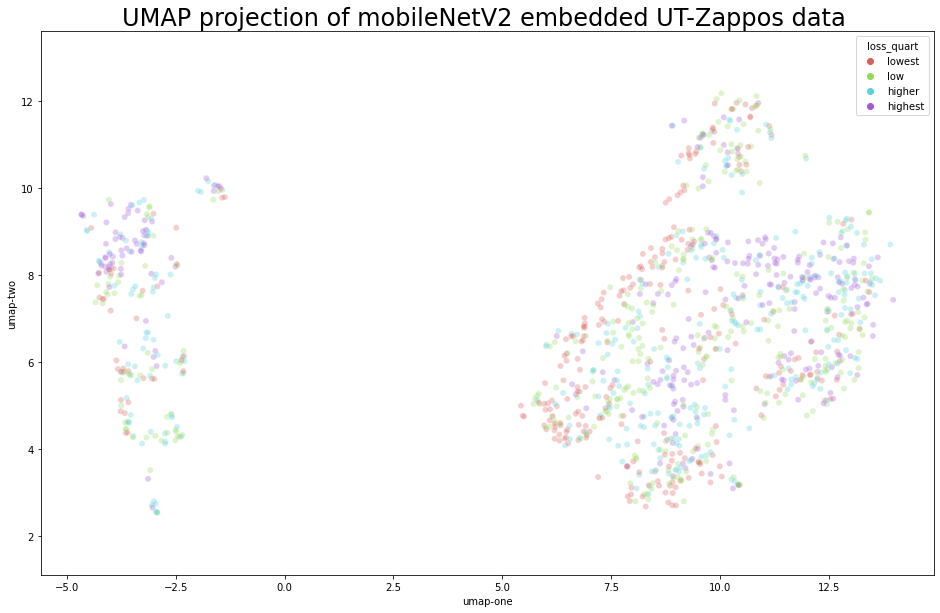

In [ ]:
# get the UMAP on deck
smpl_fac=.1
data = tst
data['umap-one'] = embedding[:,0]
data['umap-two'] = embedding[:,1] 

plt.figure(figsize=(16,10))
sns.scatterplot(
    x="umap-one",
    y="umap-two",
    hue="loss_quart",
    palette=sns.color_palette("hls", 4),
    data=data.sample(frac=smpl_fac),
    legend="full",
    alpha=0.3
)
plt.gca().set_aspect('equal', 'datalim')
plt.title(f'UMAP projection of mobileNetV2 embedded UT-Zappos data ', fontsize=24)
plt.savefig('UMAP 2-D sz{sz}') 
plt.show()

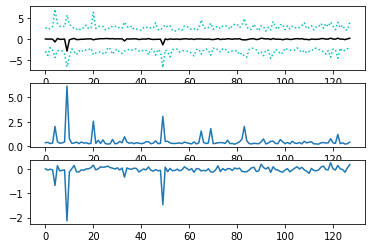

In [ ]:
plt.subplot(3,1,1)
plt.plot(np.median(db_feats,axis=0),'k-')
plt.plot(db_feats.min(axis=0),'c:')
plt.plot(db_feats.max(axis=0),'c:')

plt.subplot(3,1,2)
plt.plot(db_feats.var(axis=0))
plt.subplot(3,1,3)
plt.plot(db_feats.mean(axis=0))
# plt.subplot(4,1,4)
# plt.plot(db_feats.min(axis=0))
# plt.plot(db_feats.max(axis=0))


TODO:  find top dimensions across which we have variance.. .e.g. top 10

create sneakers spanning that dimension anchored on a good example. (all other latents constant)... 

create slider tools for top 10



In [ ]:
def get_top_lats(stacked_feats,n=10):
    """
    input: db_feats is the database of features...
    n number of latents that are "top" variance
    """
    # get the variance across the database
    vr_feats = stacked_feats.var(axis=0)
    #rank and reverse so largest are first
    ranked_feats = vr_feats.argsort()[::-1]
    
    # return indices to the top N dimensions
    return ranked_feats[:n]
    
    

from itertools import product

#Manages device/graph status/type handling
def from_latent(net, vec):
    with torch.no_grad():
        net.eval()
        return net.decoder( torch.tensor(vec).to('cuda').float()[None,:] ).cpu().detach().numpy()

def get_sampling_grid(net, grid):
    image = TensorImage(torch.tensor([]))
    
    for vec in grid:
        image = torch.cat([image, torch.from_numpy(from_latent(net,vec) ) ] )
        
    return image


def sample_from_latent(net, latent, top_dims, grid_n = 10,save = True, location = 'grid.png'):
    # create a "grid" which deals linear ramps for our n_dims one at a time into
    grid = []
    dlat = np.linspace(-5,5,grid_n-1)

    for d in top_dims:
        row = [latent]
        lat = np.tile(latent,(grid_n-1,1)) #reset each time...
        lat[:,d]=dlat
        row += [ii for ii in lat]
        grid += row
    
    results = get_sampling_grid(net, grid)
    if save:
        save_image(results, location)
    return results

from torchvision.utils import make_grid
def show_image_grid(results,grid_n=10,decoder = None):
    img = make_grid(results, nrow = grid_n)
    _, ax = plt.subplots(ncols=1, nrows=1, figsize=(19,19))
    #ax.imshow(img.permute(1,2,0)) 
    #img.show()
    im = img.squeeze() if decoder is None else decoder((img,[]))[0].squeeze()
    im.show(ax)


## TODO:  need to use PCA on the latent dimensions to find the dimensions while deal with the database augmentation, and likely the semantic pieces of the workings

In [ ]:
n=20
top10 = get_top_lats(db_feats,n=n)

In [ ]:
top10

example_lat = db_feats[3]

dlat = np.linspace(-1.5,1.5,9)
grid_n = 9
latent = example_lat
top_dims = top10
#latent[top10[0],None]=dlat

In [ ]:

d = top_dims[0]
row = [latent]
lat = np.tile(example_lat,(grid_n,1))
lat[:,d]=dlat
row += [ii for ii in lat]
    
len(row),row[-1].shape

(10, (128,))

In [ ]:
grid=[]
for d in top_dims:
    row = [latent]
    lat = np.tile(latent,(grid_n,1)) #reset each time...
    lat[:,d]=dlat
    row += [ii for ii in lat]
    grid += row
len(grid)

200

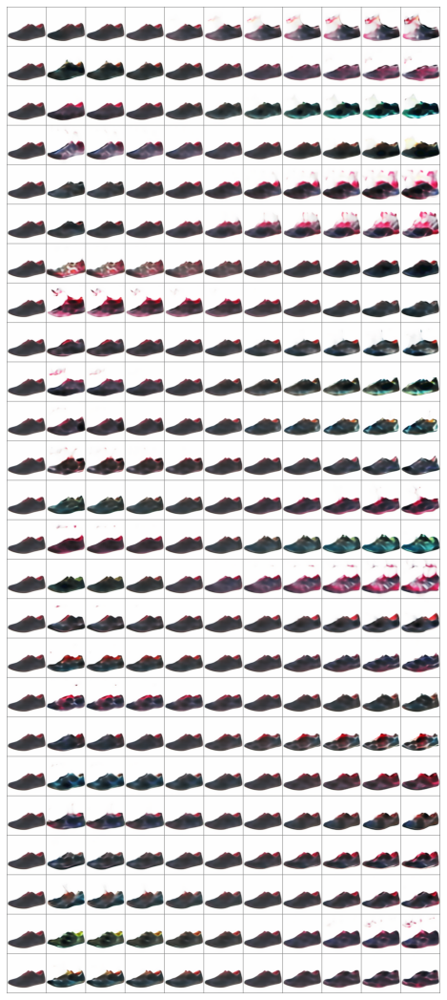

In [ ]:
example_lat = db_feats[7]
grid_n = 11
n=25
topN = get_top_lats(db_feats,n=n)

sampled_images = sample_from_latent(learn.model, example_lat, topN,grid_n, save = False)

img = show_image_grid(sampled_images, grid_n = grid_n,decoder = dls.decode)

In [ ]:
def get_top_lats(stacked_feats,n=10):
    """
    input: db_feats is the database of features...
    n number of latents that are "top" variance
    """
    # get the variance across the database
    vr_feats = stacked_feats.var(axis=0)
    #rank and reverse so largest are first
    ranked_feats = vr_feats.argsort()[::-1]
    
    # return indices to the top N dimensions
    return ranked_feats[:n]
    
    
# pkl
# from itertools import product

# #Manages device/graph status/type handling
# def from_latent(net, vec):
#     with torch.no_grad():
#         net.eval()
#         return net.decoder( torch.tensor(vec).to('cuda').float()[None,:] ).cpu().detach().numpy()

# def get_sampling_grid(net, grid):
#     image = TensorImage(torch.tensor([]))
    
#     for vec in grid:
#         image = torch.cat([image, torch.from_numpy(from_latent(net,vec) ) ] )
        
#     return image


def interp(vec1, vec2, divs=5, include_ends=True):
    """
    Interpolates between 2 arbitrary dimension vectors and returns the result.
    Parameters
    ----------
    vec1 : np array
        Starting vector to interpolate from.
    vec2 : np array
        Ending vector to interpolate to.
    divs : integer
        Number of divisions between the vectors.
    include_ends: bool
        Wether to include the starting and ending vectors in the output array.
    Returns
    -------
    Numpy array with 1 extra dimension of size divs (+ 2 if include_ends=True).
    """
    out = []
    amounts = np.array(range(divs + 1)) / divs if include_ends else np.array(range(1, divs)) / divs
    for amt in amounts:
        interpolated_vect = vec1 * amt + vec2 * (1 - amt)
        out.append(interpolated_vect)
    return np.stack(out)


def traverse_latent(net, latent1, latent2, grid_n = 10,save = False, location = 'grid.png'):
    # create a "grid" which deals linear ramps for our n_dims one at a time into

    traversal = interp(latent1,latent2,divs=grid_n-1)


    grid = [ii for ii in traversal]
    
    results = get_sampling_grid(net, grid)
    if save:
        save_image(results, location)
    return results

# from torchvision.utils import make_grid
# def show_image_grid(results,grid_n=10,decoder = None):
#     img = make_grid(results, nrow = grid_n)
#     _, ax = plt.subplots(ncols=1, nrows=1, figsize=(19,19))
#     #ax.imshow(img.permute(1,2,0)) 
#     #img.show()
#     im = img.squeeze() if decoder is None else decoder((img,[]))[0].squeeze()
#     im.show(ax)


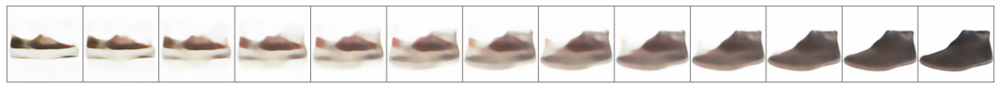

In [ ]:
# traversal = interp(db_feats[0],db_feats[1],10)
# traversal.shape
# grid = [ii for ii in traversal]
# grid[0].shape

# traverse_latent(net, latent1, latent2, grid_n = 10,save = True, location = 'grid.png'):

example_lat = db_feats[14]
grid_n = 13

traversed_images = traverse_latent(learn.model,db_feats[10],db_feats[-1],grid_n)

timg = show_image_grid(traversed_images, grid_n = grid_n,decoder = dls.decode)

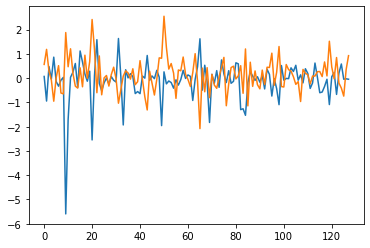

In [ ]:
plt.plot(db_feats[[10,-1]].T)

In [ ]:
dls.decode((img.squeeze(),[]))[0][0].squeeze().show(ctx=ax)

AttributeError: 'NoneType' object has no attribute 'squeeze'

In [ ]:
net = learn.model
vec = grid[0]

#def from_latent(net, vec):
image = TensorImage(torch.tensor([]))

for vec in grid:
    image = torch.cat([image, torch.from_numpy(from_latent(net,vec) ) ] )


In [ ]:
dcd = dls.decode



dcd((img,[]))

(None, TensorImage([], size=(1, 3, 1, 0), dtype=torch.int64))

In [ ]:
fn = df.path.values
snk2vec = dict(zip(fn,db_feats))

snk2vec[list(snk2vec.keys())[0]]

embedding = get_umap_embedding(db_feats)
snk2umap = dict(zip(fn,embedding))

## investigate how the latent representation depends on augmentation

In [ ]:
def get_encoding_test_btfms(stats = 'sneaker'):
    "copy of `get_ae_btfms` for testing augmentation parameters beyond what the VAE was trained under."
    # could use globals IM_STATS['sneaker'] and IM_STATS['imagenet']
    im_stats = ([.5,.5,.5],[.5,.5,.5]) if stats == 'sneaker' else imagenet_stats
    batch_tfms = Normalize.from_stats(*im_stats)
    #batch_tfms = Normalize.from_stats([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])
    rand_tfms = aug_transforms(mult=1.0,
               do_flip=True,
               flip_vert=False,
               max_rotate=5.0,
               min_zoom=.95,
               max_zoom=1.0,
               max_lighting=0.1,
               max_warp=0.1,
               p_affine=0.66,
               p_lighting=0.2,
               xtra_tfms=None,
               size=None,
               mode='bilinear',
               pad_mode='border',
               align_corners=True,
               batch=False,
               min_scale=1.0)
    return rand_tfms+[batch_tfms]

In [ ]:
def sample_for_augment_test_datablocks(df,n_samples=100, n_resamples=100, rs = None):
    """
    resample `n_samples`, `n_resample` times to test for the variability of latents with our augmentation scheme
    reproducability can be tested by setting the `rs` random_state
    """
    df = df[["path","train","test","validate","t_t_v"]].copy()
    df.loc[:,'is_valid'] = df.test | df.validate

    df = df.sample(n=n_samples,random_state=rs)
    
    df = df.loc[df.index.repeat(n_resamples)]

    df.loc[:,'og_idx'] = df.index
    df=df.reset_index(drop=True)
    return df



def get_aug_test_DataBlock(im_path=L_ROOT/"data",stats = 'sneaker',im_size=IMG_SIZE):
    "wrapper to get the standard ae datablock"
    # use partials or a class wrapper to get around this yucky hack
    global image_path
    image_path = im_path
    # what is the block that gets everything?
    mytfms = get_encoding_test_btfms(stats=stats)
    block = DataBlock(blocks=(ImageBlock(cls=PILImage), ImageBlock(cls=PILImage), LatentsTensorBlock ),
              get_x=df_lat_x, 
              get_y=[df_lat_y, noop], #don't need to get the LatentsTensorBlock, just create
              #splitter=ColSplitter('is_valid'), 
              splitter=IndexSplitter([]),
              item_tfms= FeatsResize(im_size,method='pad', pad_mode='border'),
              batch_tfms = mytfms,
              n_inp = 1)
 
    return block


In [ ]:
# n_resamples = 100
# n_samples = 100
# df = df.sample(n=n_samples)

# df = df.loc[df.index.repeat(n_resamples)]
# df.loc[:,'og_idx'] = df.index
# df=df.reset_index(drop=False)


n_samples=10
n_resamples=500


resample =  sample_for_augment_test_datablocks(df,n_samples=n_samples, n_resamples=n_resamples, rs = 667)


In [ ]:
resample.shape

(5000, 7)

In [ ]:

#block = get_ae_DataBlock(aug=False,im_size=160)
block = get_aug_test_DataBlock(im_size=160,im_path=image_path)

latent_dim = 128

# cbs = [AnnealedLossCallback(),TerminateOnNaNCallback(),         
#                SaveModelCallback(fname=datetime.now().strftime('%Y-%m-%d %Hh%M.%S'), every_epoch=True),
#                ParamScheduler({'kl_weight': SchedNo(1.,1.) })]
cbs = [AnnealedLossCallback(),TerminateOnNaNCallback(), ShowGraphCallback(),        
               ParamScheduler({'kl_weight': SchedNo(1.,1.) })]

alpha = 20
# note that alpha needs to be adjusted to scale MMD regularizer compared to error for batchmean=true
#.  e.g.  *= 3*IMG_SIZE**2/latent_dim
batchmean = True
useL1 = False
hidden_dim = None

metrics = default_MMEVAE_metrics(alpha,batchmean,useL1)

batch_size = 64
dls = block.dataloaders(resample, batch_size=batch_size,drop_last=False,shuffle=False)
dls.shuffle = False

arch='resblock'
vae = ResBlockAE(get_resblockencoder_parts(arch), hidden_dim=hidden_dim,latent_dim=latent_dim,  im_size=IMG_SIZE,out_range=OUT_RANGE)
  
# let beta be calculated by : 3*im_size*im_size/latent_dim
loss_func = MMDLoss(batchmean=batchmean,alpha=alpha,useL1=False)

learn = Learner(dls, vae, cbs=cbs,loss_func=loss_func, metrics=metrics,splitter=AE_split)#.to_fp16() #wd=config['wd'],opt_func=ranger,
     
    
learn.load('MMDVae-A-latent128-resblock-alpha20_2021-03-26_19.35.59')

In [ ]:
%%time
df_resampled = get_vae_encodings_df(resample,learn)

packing 79 batches into dataframe
CPU times: user 3.21 s, sys: 353 ms, total: 3.56 s
Wall time: 4.82 s


In [ ]:
# now get stats from df_

#df_resampled.groupby('path').agg(['mean','std'])
#og100= resample.drop_duplicates()
sampling = df_resampled.merge(resample.drop_duplicates(),on='path')

In [ ]:
sampling.tail()


,path,features,loss,mmd,idx,train,test,validate,t_t_v,is_valid,og_idx
4995,Shoes/Sneakers and Athletic Shoes/Habitat/7705393.374666.jpg,"[[-0.49863994], [0.34014404], [-0.47675553], [0.8566633], [0.1547373], [0.12641951], [1.2343066], [-0.9189507], [0.15405805], [-0.2878815], [-0.3080045], [-0.46971536], [-0.2874697], [-1.420343], [0.5415853], [-1.0448205], [-0.19472478], [0.045622703], [0.3110851], [-0.44307482], [0.6017698], [0.66788036], [-0.2763483], [0.31080008], [-0.069068216], [-1.1993306], [1.035366], [0.039529134], [0.11652258], [-1.6440914], [-0.06973192], [0.29984215], [-0.5011713], [0.17340295], [0.35913137], [-2.5511503], [0.12450419], [0.2012774], [0.18755762], [-0.4499175], [0.08186923], [0.34906784], [2.0353...",0.041411,0.007213,4995,True,False,False,train,False,2359
4996,Shoes/Sneakers and Athletic Shoes/Habitat/7705393.374666.jpg,"[[-0.7314617], [0.6145839], [-0.007617209], [0.49674842], [0.394978], [0.7075663], [0.9996343], [-0.8569097], [-0.20564751], [-0.4675478], [-0.25763413], [-0.73187256], [-0.29429755], [-1.2394453], [0.3717455], [-1.1354797], [-0.259208], [-0.6524343], [0.56025386], [-0.24603948], [0.41017455], [0.48866537], [-0.19231173], [0.4150427], [-0.035197474], [-0.8584602], [0.6412982], [0.23703861], [-0.1111652], [-0.86613315], [0.17412822], [0.5163903], [-0.6320626], [-0.34614933], [0.30219668], [-2.221511], [0.33644113], [0.5748197], [-0.122655526], [-0.9179836], [-0.09982446], [0.3508418], [1.61...",0.043139,0.004543,4996,True,False,False,train,False,2359
4997,Shoes/Sneakers and Athletic Shoes/Habitat/7705393.374666.jpg,"[[-0.7075097], [0.47643194], [-0.040358815], [0.5569252], [0.4009261], [0.49912316], [1.0906172], [-0.85143745], [-0.17445777], [-0.50506604], [-0.22650304], [-0.43958905], [-0.31526896], [-1.4326521], [0.60354525], [-0.7215353], [-0.6207318], [-0.5481214], [0.37976915], [-0.2703057], [0.11474451], [0.43714625], [-0.58331054], [0.2988655], [0.23043716], [-0.73815405], [0.97173494], [0.44450435], [-0.08186815], [-0.9027001], [0.46131343], [0.36094132], [-0.5655905], [-0.530137], [0.38847885], [-2.253685], [0.26458418], [0.31505802], [-0.3262103], [-1.0440588], [-0.13333505], [0.5021022], [1...",0.042859,0.004517,4997,True,False,False,train,False,2359
4998,Shoes/Sneakers and Athletic Shoes/Habitat/7705393.374666.jpg,"[[0.059504207], [0.30528954], [-0.058442514], [0.20594335], [-0.5886119], [1.0584419], [0.71614146], [-0.11387567], [-1.114061], [-0.063203596], [0.44802245], [-0.3736551], [0.20556495], [0.7615777], [-0.560217], [-0.19313958], [-0.8070528], [-0.92483896], [0.27442932], [-0.4756168], [0.3580268], [0.6273927], [1.6472753], [0.035258308], [-0.5408743], [0.49925956], [0.14532177], [0.50751317], [0.5353989], [-0.8129985], [-0.004774453], [-0.17596018], [-0.5900348], [-0.3509205], [-0.07686101], [0.8347804], [-0.19632068], [0.36498687], [-0.20727426], [-0.50638175], [0.0598656], [1.0452], [1.64...",0.038504,0.003198,4998,True,False,False,train,False,2359
4999,Shoes/Sneakers and Athletic Shoes/Habitat/7705393.374666.jpg,"[[0.04052745], [0.031520315], [0.36985567], [-0.40909225], [-0.51469624], [-0.20883983], [0.52710927], [-0.15782274], [-1.0887156], [-0.037305463], [-0.048419], [0.11697066], [0.030836046], [-0.08491857], [-0.26042122], [0.1019989], [-0.525046], [-1.9512498], [0.28736278], [0.28334275], [0.3880277], [0.2678108], [1.609862], [-0.2807783], [-0.39415967], [0.45268], [0.05420241], [0.1433994], [-0.25359637], [-0.54230857], [0.010272557], [-0.41562936], [-0.37381032], [-0.4544797], [-0.2771552], [0.27134302], [-0.21048315], [0.038906462], [0.076649345], [-0.90718424], [-0.14760491], [0.5439253]...",0.043353,0.005482,4999,True,False,False,train,False,2359


In [ ]:
sampling.head()

ogidx = sampling.og_idx.values
lats = np.stack(sampling.features)
# lss = np.stack(sampling.loss)
# mmds = np.stack(sampling.mmd)

mmds = sampling.mmd.values
lss = sampling.loss.values
pth = sampling.path.values



mmds.shape,lss.shape,lats.shape,ogidx.shape,mmds.reshape((n_resamples, n_samples)).shape

# to make...
# histograms of loss and mmd
# fidelity of features...
# high variability

# make an automatic procedure for visualizing variability per example...
# NEXT:  vary one augmentation at a time... i.e. flips, scales, rotates, shears

((5000,), (5000,), (5000, 128, 1), (5000,), (500, 10))

In [ ]:
oi = ogidx.reshape((n_samples,n_resamples))
ommd = mmds.reshape((n_samples,n_resamples))
ols = lss.reshape((n_samples,n_resamples))
olat = lats.reshape((n_samples,n_resamples,-1))

op = pth.reshape((n_samples,n_resamples))
op[:,0:2]

array([['Shoes/Sneakers and Athletic Shoes/Merrell/7659777.401.jpg',
        'Shoes/Sneakers and Athletic Shoes/Merrell/7659777.401.jpg'],
       ['scraped/goat/94b6318a43.jpg', 'scraped/goat/94b6318a43.jpg'],
       ['Shoes/Sneakers and Athletic Shoes/Mizuno/7891807.326136.jpg',
        'Shoes/Sneakers and Athletic Shoes/Mizuno/7891807.326136.jpg'],
       ['Shoes/Sneakers and Athletic Shoes/SKECHERS/8081644.275.jpg',
        'Shoes/Sneakers and Athletic Shoes/SKECHERS/8081644.275.jpg'],
       ['Shoes/Sneakers and Athletic Shoes/New Balance/7942181.6.jpg',
        'Shoes/Sneakers and Athletic Shoes/New Balance/7942181.6.jpg'],
       ['Shoes/Sneakers and Athletic Shoes/ASICS/7885670.358604.jpg',
        'Shoes/Sneakers and Athletic Shoes/ASICS/7885670.358604.jpg'],
       ['Shoes/Sneakers and Athletic Shoes/Circa/7328707.374401.jpg',
        'Shoes/Sneakers and Athletic Shoes/Circa/7328707.374401.jpg'],
       ['Shoes/Sneakers and Athletic Shoes/Camper/7847807.310601.jpg',
        'S

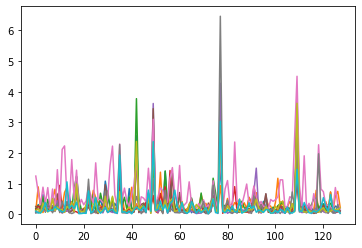

In [ ]:
mdl = np.median(olat,axis=1).squeeze()
ml = olat.mean(axis=1).squeeze()
vl = olat.var(axis=1).squeeze()

plt.plot(vl.T)

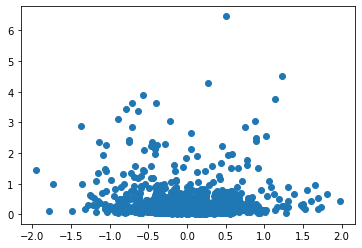

In [ ]:
ml = olat.mean(axis=1).squeeze()
vl = olat.var(axis=1).squeeze()

plt.scatter(ml.T,vl.T)

In [ ]:
olat.mean(axis=(0,1))

array([-0.14910845,  0.06119838,  0.05651284, -0.16537264,  0.17888509,
       -0.40003657,  0.33155572, -0.29667857, -0.17724428, -0.38937315,
       -0.1095457 , -0.11006449, -0.09412298, -0.19441493,  0.08532452,
        0.09205528, -0.21043782, -0.8712923 , -0.21580644, -0.04101522,
        0.21048902,  0.30049518,  0.47862846,  0.14172894,  0.1356248 ,
        0.11754823, -0.05208224, -0.04445714,  0.10672005, -0.26108527,
       -0.06592296,  0.03292974, -0.10199713, -0.07227648,  0.04535016,
       -0.52548885,  0.04638737,  0.08266775, -0.05344404, -0.3602426 ,
       -0.02918761,  0.14483759,  0.94918615,  0.08395974,  0.22723098,
       -0.1892076 ,  0.03243921,  0.5188047 , -0.06517275, -0.69061655,
       -0.44427767,  0.20860466,  0.15479404,  0.09267846, -0.17469425,
        0.01228106,  0.15372956, -0.6024941 , -0.32305807,  0.31668952,
        0.01785548,  0.04596641, -0.06691337, -0.10667873,  0.02528185,
       -0.5732143 ,  0.14002   ,  0.09669762,  0.24249062,  0.05

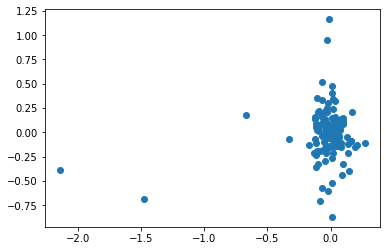

In [ ]:
plt.scatter(db_feats.mean(axis=0),olat.mean(axis=(0,1)))

In [ ]:
ii = sampling[sampling.path.str.contains('goat')]
ii

,path,features,loss,mmd,idx,train,test,validate,t_t_v,is_valid,og_idx
500,scraped/goat/94b6318a43.jpg,"[[-0.37829313], [-0.36939976], [0.23998071], [0.7859251], [1.9345464], [0.13695025], [1.3063778], [-1.5307673], [-1.3059316], [-1.5393821], [-0.89471996], [-1.0616251], [-0.66288435], [-1.7877587], [-0.44345814], [-0.123581454], [0.43152517], [-0.6142332], [0.37700546], [-0.31713253], [0.32224035], [0.754813], [0.52409387], [0.4459424], [1.2589077], [0.12290257], [0.4411359], [1.0577145], [0.80693716], [-2.1406221], [0.17045611], [0.16242883], [-1.1675975], [0.47250986], [-0.9671723], [-1.7345994], [1.0084864], [-0.046852503], [-0.6495479], [-1.4146533], [0.5125035], [-0.4017795], [2.38258...",0.029416,0.001837,500,True,False,False,train,False,9770
501,scraped/goat/94b6318a43.jpg,"[[0.1607039], [2.0824974], [1.1037346], [0.7220373], [0.19264342], [-0.62744975], [0.16743979], [0.13377558], [0.34228268], [-1.1141362], [-0.97623944], [0.81679], [0.7405804], [0.18213117], [-0.6956127], [1.1885692], [-1.1332009], [-2.803609], [0.009633377], [0.18158795], [0.86163765], [1.3187789], [0.49134865], [0.55274796], [-0.67004555], [-0.9335861], [0.8081635], [1.412359], [0.68525916], [-1.2345438], [-0.30917987], [-0.14687738], [0.52212507], [-0.14067253], [0.33879617], [0.097205386], [-0.6542921], [0.5575203], [-0.56299835], [-0.59486187], [-0.39379257], [-0.46573347], [1.1262935...",0.031574,0.000306,501,True,False,False,train,False,9770
502,scraped/goat/94b6318a43.jpg,"[[-0.47532025], [1.4352771], [0.25649697], [0.5308806], [0.75801307], [-0.566947], [1.0890994], [-0.16991086], [-1.0197518], [-1.8464255], [-2.2478986], [0.21445355], [0.3760342], [-1.0594183], [-0.23136993], [0.3616723], [-0.5805178], [-2.3549206], [-0.13133718], [0.5416677], [1.0236518], [0.834582], [1.0871321], [0.2094461], [0.2941195], [-0.41944173], [0.6735162], [-0.5299853], [0.1556689], [-0.9131642], [-0.8817168], [-0.11200879], [0.7062889], [0.23498367], [1.1714146], [-0.7542321], [-0.48670793], [0.5588601], [-0.1463844], [-1.3098267], [-0.095328525], [0.25287575], [0.40597776], [-...",0.032840,0.000632,502,True,False,False,train,False,9770
503,scraped/goat/94b6318a43.jpg,"[[-0.14677389], [-0.28829697], [0.23950955], [0.7831203], [1.6227319], [-0.008392267], [0.86772937], [-1.4355544], [-1.0395926], [-1.4886371], [-0.61882555], [-0.65596616], [-0.8116956], [-1.5389013], [-0.18004005], [-0.21231717], [0.19556236], [-0.36045226], [0.50279546], [-0.498393], [0.19447657], [0.87421536], [-0.2942247], [0.36984795], [1.2601026], [0.06680675], [0.9753207], [1.3632555], [0.60827696], [-2.1187284], [0.025865948], [0.1106119], [-0.9198125], [-0.00063391775], [-0.6416817], [-1.4123869], [0.9249702], [-0.06867124], [-0.73656946], [-1.8024893], [0.73411095], [-0.13876605]...",0.028226,0.001151,503,True,False,False,train,False,9770
504,scraped/goat/94b6318a43.jpg,"[[0.24701776], [-0.46963322], [0.06443851], [0.8363748], [1.8244003], [-0.07288434], [0.9334237], [-1.8337888], [-0.71571034], [-2.0504], [-0.290795], [-0.8096192], [-0.43263182], [-2.0123901], [-0.6776886], [-0.14450999], [-0.14277822], [-0.35338244], [0.16467567], [-0.5016068], [0.668312], [0.7994671], [-0.47071454], [0.463367], [1.3215994], [0.28865832], [0.4052312], [1.0839497], [0.2167443], [-1.5614388], [1.1058415], [-0.285258], [-0.8242782], [-0.017800111], [-0.37256378], [-2.2592814], [0.8746804], [0.14840442], [-1.03187], [-1.7303652], [0.6636881], [0.11314462], [2.2954807], [-0.1...",0.030227,0.000696,504,True,False,False,train,False,9770
...,...,...,...,...,...,...,...,...,...,...,...
995,scraped/goat/94b6318a43.jpg,"[[0.62211275], [1.1078724], [-1.1606897], [0.44133413], [-0.48483977], [0.8548065], [0.6420446], [-0.09206468], [-0.5355666], [-1.1731906], [-0.6227584], [-0.18961303], [-0.03746385], [-0.32083806], [-0.17817323], [-0.7265991], [-0.26637116], [0.112031095], [0.6765315], [-0.60051674], [0.19124384], [1.0349029], [-1.129198], [-0.20010842], [0.57830125], [-0.16142048], [1.5186803], [0.4425936], [-0

In [ ]:
%%time

#theres a shuffle in here we need to figure out... need the learn.dls.indexes

# del x_hat, o, latent,z,outs,inps
# torch.cuda.empty_cache()


outs = []
outls = []
pix_loss = []
mmd_loss = []
inps = []
batchn = 0

#model = learn.model
learn.dls.shuffle=False
with torch.no_grad():
    for imgs,aa,bb in learn.dls.train:
        o = learn.model.cuda()(imgs)
        x_hat,latent = o
        z,_ = latent.split(1,dim=2)
        outls.append(to_detach(z))
        recon_err = to_detach(pix_l2_err(x_hat,imgs))
        pix_loss.extend(recon_err)
        reg = to_detach(mmd_vae_reg(z,z_prior=None, device='cuda'))
        mmd_loss.extend(reg)
        batchn += 1
        outs.append(to_detach(x_hat))
        inps.append(to_detach(imgs))
        #if batchn>10: break

            
            

CPU times: user 3.55 s, sys: 876 ms, total: 4.42 s
Wall time: 5.41 s


In [ ]:
learn.dls.get_idxs()

[0,
 1,
 2,
 3,
 4,
 5,
 6,
 7,
 8,
 9,
 10,
 11,
 12,
 13,
 14,
 15,
 16,
 17,
 18,
 19,
 20,
 21,
 22,
 23,
 24,
 25,
 26,
 27,
 28,
 29,
 30,
 31,
 32,
 33,
 34,
 35,
 36,
 37,
 38,
 39,
 40,
 41,
 42,
 43,
 44,
 45,
 46,
 47,
 48,
 49,
 50,
 51,
 52,
 53,
 54,
 55,
 56,
 57,
 58,
 59,
 60,
 61,
 62,
 63,
 64,
 65,
 66,
 67,
 68,
 69,
 70,
 71,
 72,
 73,
 74,
 75,
 76,
 77,
 78,
 79,
 80,
 81,
 82,
 83,
 84,
 85,
 86,
 87,
 88,
 89,
 90,
 91,
 92,
 93,
 94,
 95,
 96,
 97,
 98,
 99,
 100,
 101,
 102,
 103,
 104,
 105,
 106,
 107,
 108,
 109,
 110,
 111,
 112,
 113,
 114,
 115,
 116,
 117,
 118,
 119,
 120,
 121,
 122,
 123,
 124,
 125,
 126,
 127,
 128,
 129,
 130,
 131,
 132,
 133,
 134,
 135,
 136,
 137,
 138,
 139,
 140,
 141,
 142,
 143,
 144,
 145,
 146,
 147,
 148,
 149,
 150,
 151,
 152,
 153,
 154,
 155,
 156,
 157,
 158,
 159,
 160,
 161,
 162,
 163,
 164,
 165,
 166,
 167,
 168,
 169,
 170,
 171,
 172,
 173,
 174,
 175,
 176,
 177,
 178,
 179,
 180,
 181,
 182,
 183,
 184,


In [ ]:
outls[0].shape

torch.Size([64, 128, 1])

In [ ]:
oo = np.vstack(outls).squeeze()
oo.shape

(5000, 128)

In [ ]:
out = [np.array(o) for o in oo] #
out[0].shape

(128,)

In [ ]:
outs_ = torch.vstack(outs)
inps_ = torch.vstack(inps)

In [ ]:
paths = sampling.iloc[learn.dls.train.get_idxs()].path.values

paths

array(['Shoes/Sneakers and Athletic Shoes/Merrell/7659777.401.jpg',
       'Shoes/Sneakers and Athletic Shoes/Merrell/7659777.401.jpg',
       'Shoes/Sneakers and Athletic Shoes/Merrell/7659777.401.jpg', ...,
       'Shoes/Sneakers and Athletic Shoes/Habitat/7705393.374666.jpg',
       'Shoes/Sneakers and Athletic Shoes/Habitat/7705393.374666.jpg',
       'Shoes/Sneakers and Athletic Shoes/Habitat/7705393.374666.jpg'],
      dtype=object)

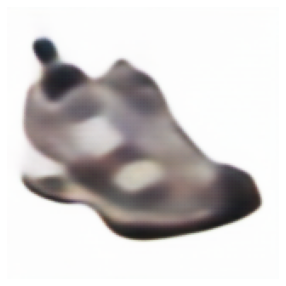

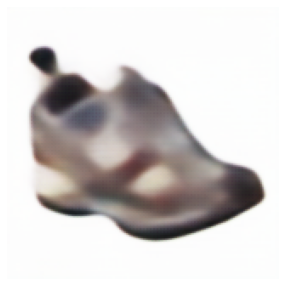

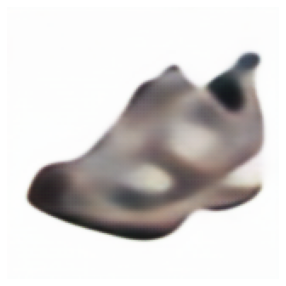

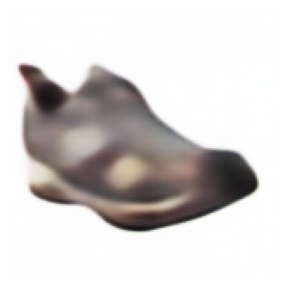

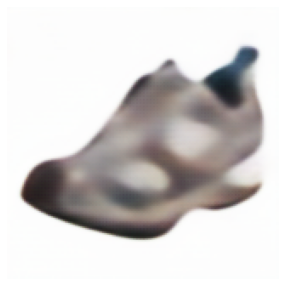

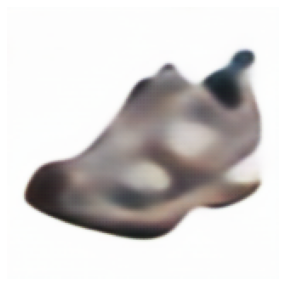

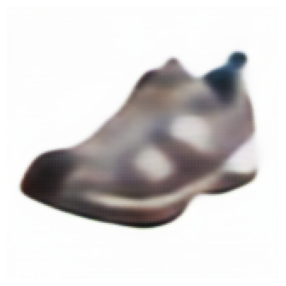

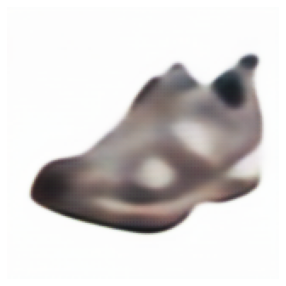

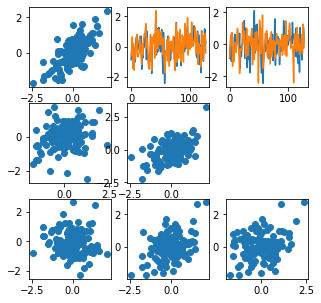

In [ ]:
#dec = learn.dls.decode_batch(imgs,o)
[dls.decode((outs_.squeeze(),[]))[0][i].squeeze().show() for i in range(9)]
#dls.decode((inps_.squeeze(),[]))[0].squeeze().show()

vs = out[:9]
plt.subplot(2,2,1)
plt.scatter(out[0],out[1])
plt.subplot(2,2,2)
plt.plot(oo[0:2].squeeze().T)
plt.subplot(2,2,3)
plt.scatter(out[1],out[2])
plt.subplot(2,2,4)
plt.scatter(out[0],out[3])


plt.subplot(3,3,1)
plt.scatter(out[0],out[1])
plt.subplot(3,3,2)
plt.plot(oo[0:2].squeeze().T)
plt.subplot(3,3,3)
plt.plot(oo[[0,4],].squeeze().T)

plt.subplot(3,3,4)
plt.scatter(out[1],out[2])
plt.subplot(3,3,5)
plt.scatter(out[0],out[3])


plt.subplot(3,3,7)
plt.scatter(out[0],out[1013])

plt.subplot(3,3,8)
plt.scatter(out[0],out[1014])
#plt.plot(oo[[0,1013],].squeeze().T)



plt.subplot(3,3,9)
plt.scatter(out[1],out[1014])

# plt.subplot(3,3,9)
# plt.plot(oo[[1,1014],].squeeze().T)



# outs = []
# inps = []
# dl = learner.dls.test_dl(imgs)
# learn.model.eval()
# with torch.no_grad():
#     for batch in dl:
#         outs.append(learner.model(batch[0]))
#         inps.append(batch[0])

# outs = torch.stack(outs)
# inps = torch.stack(inps)
# dec = learner.dls.decode_batch((*tuplify(inps), *tuplify(outs)))

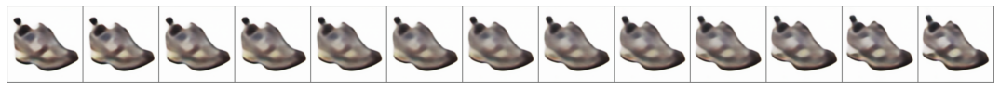

In [ ]:

# traverse_latent(net, latent1, latent2, grid_n = 10,save = True, location = 'grid.png'):

grid_n = 13

lat1 = out[0]
lat2 = out[1]
traversed_images = traverse_latent(learn.model,lat1,lat2,grid_n)

timg = show_image_grid(traversed_images, grid_n = grid_n,decoder = dls.decode)



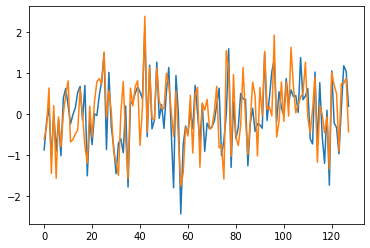

In [ ]:
#plt.plot(out[[0,1]].T)
plt.plot(oo[[0,1],].squeeze().T)

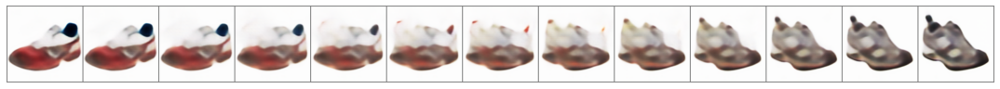

In [ ]:

# traverse_latent(net, latent1, latent2, grid_n = 10,save = True, location = 'grid.png'):

grid_n = 13

lat1 = out[0]
lat2 = out[1013]
traversed_images = traverse_latent(learn.model,lat1,lat2,grid_n)

timg = show_image_grid(traversed_images, grid_n = grid_n,decoder = dls.decode)



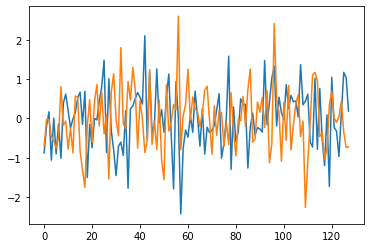

In [ ]:
#plt.plot(out[[0,1]].T)
plt.plot(oo[[0,1013],].squeeze().T)

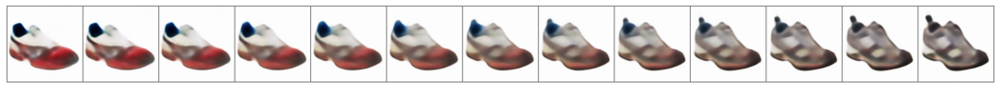

In [ ]:

# traverse_latent(net, latent1, latent2, grid_n = 10,save = True, location = 'grid.png'):

grid_n = 13

lat1 = out[0]
lat2 = out[1014]
traversed_images = traverse_latent(learn.model,lat1,lat2,grid_n)

timg = show_image_grid(traversed_images, grid_n = grid_n,decoder = dls.decode)



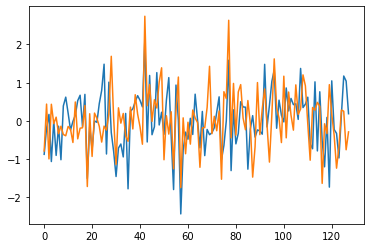

In [ ]:
#plt.plot(out[[0,1]].T)
plt.plot(oo[[0,1014],].squeeze().T)

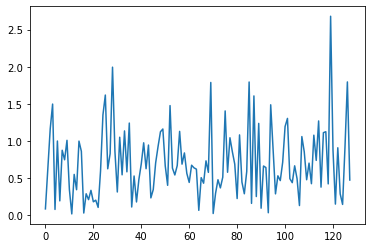

In [ ]:

plt.plot((oo[0]-oo[1014]).__abs__().squeeze())

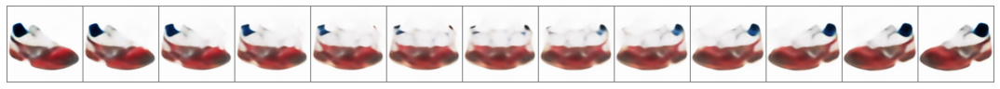

In [ ]:

# traverse_latent(net, latent1, latent2, grid_n = 10,save = True, location = 'grid.png'):

grid_n = 13

lat1 = out[1013]
lat2 = out[1014]
traversed_images = traverse_latent(learn.model,lat1,lat2,grid_n)

timg = show_image_grid(traversed_images, grid_n = grid_n,decoder = dls.decode)



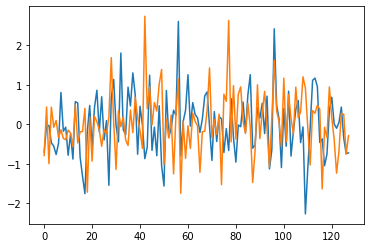

In [ ]:
#plt.plot(out[[0,1]].T)
plt.plot(oo[[1013,1014],].squeeze().T)

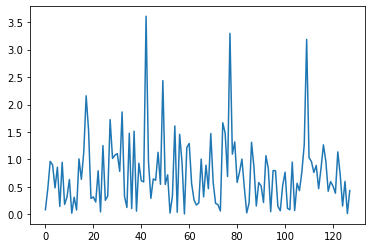

In [ ]:

plt.plot((oo[1013]-oo[1014]).__abs__().squeeze())

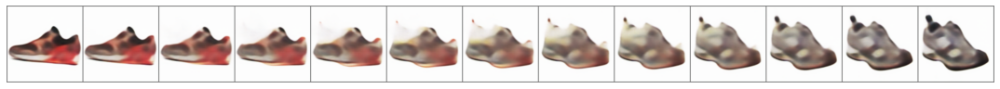

In [ ]:

# traverse_latent(net, latent1, latent2, grid_n = 10,save = True, location = 'grid.png'):

grid_n = 13

lat1 = out[0]
lat2 = out[500]
traversed_images = traverse_latent(learn.model,lat1,lat2,grid_n)

timg = show_image_grid(traversed_images, grid_n = grid_n,decoder = dls.decode)



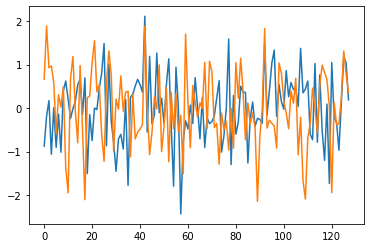

In [ ]:
#plt.plot(out[[0,1]].T)
plt.plot(oo[[0,500],].squeeze().T)

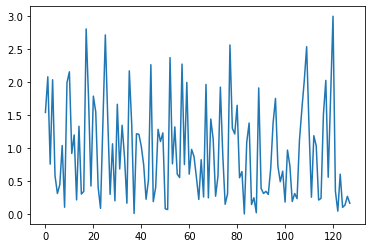

In [ ]:

plt.plot((oo[0]-oo[500]).__abs__().squeeze())

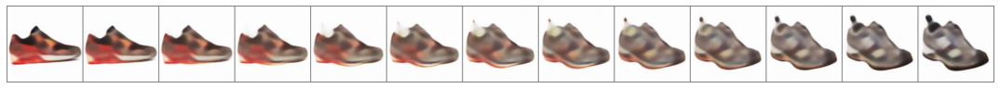

In [ ]:

# traverse_latent(net, latent1, latent2, grid_n = 10,save = True, location = 'grid.png'):

grid_n = 13

lat1 = out[0]
lat2 = out[501]
traversed_images = traverse_latent(learn.model,lat1,lat2,grid_n)

timg = show_image_grid(traversed_images, grid_n = grid_n,decoder = dls.decode)



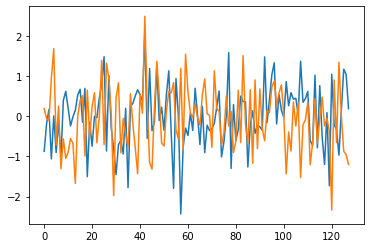

In [ ]:
#plt.plot(out[[0,1]].T)
plt.plot(oo[[0,501],].squeeze().T)

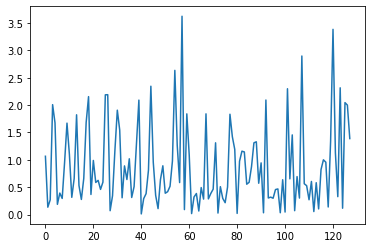

In [ ]:

plt.plot((oo[0]-oo[501]).__abs__().squeeze())

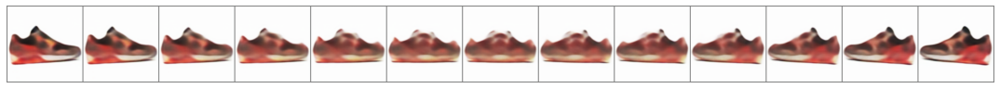

In [ ]:

# traverse_latent(net, latent1, latent2, grid_n = 10,save = True, location = 'grid.png'):

grid_n = 13

lat1 = out[500]
lat2 = out[501]
traversed_images = traverse_latent(learn.model,lat1,lat2,grid_n)

timg = show_image_grid(traversed_images, grid_n = grid_n,decoder = dls.decode)



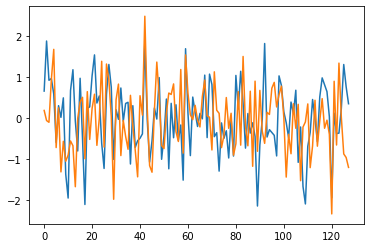

In [ ]:
#plt.plot(out[[0,1]].T)
plt.plot(oo[[500,501],].squeeze().T)

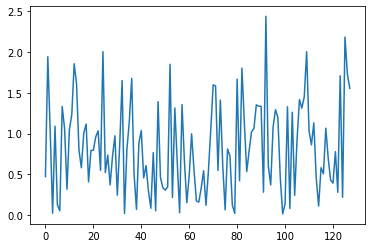

In [ ]:

plt.plot((oo[500]-oo[501]).__abs__().squeeze())

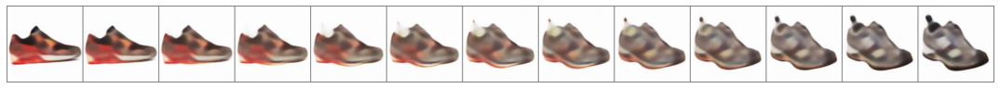

In [ ]:

# traverse_latent(net, latent1, latent2, grid_n = 10,save = True, location = 'grid.png'):

grid_n = 13

lat1 = out[0]
lat2 = out[501]
traversed_images = traverse_latent(learn.model,lat1,lat2,grid_n)

timg = show_image_grid(traversed_images, grid_n = grid_n,decoder = dls.decode)



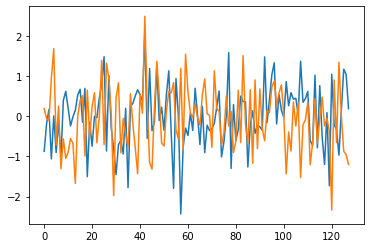

In [ ]:
#plt.plot(out[[0,1]].T)
plt.plot(oo[[0,501],].squeeze().T)

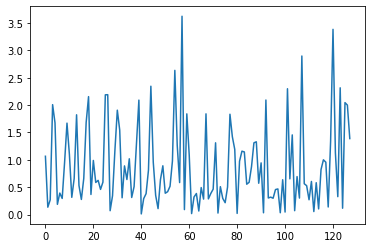

In [ ]:

plt.plot((oo[0]-oo[501]).__abs__().squeeze())

In [ ]:
n=15
top_15 = get_top_lats(oo,n=n)

array([ 42, 109,  77,  54,  49,  35,  17,  29,  56])

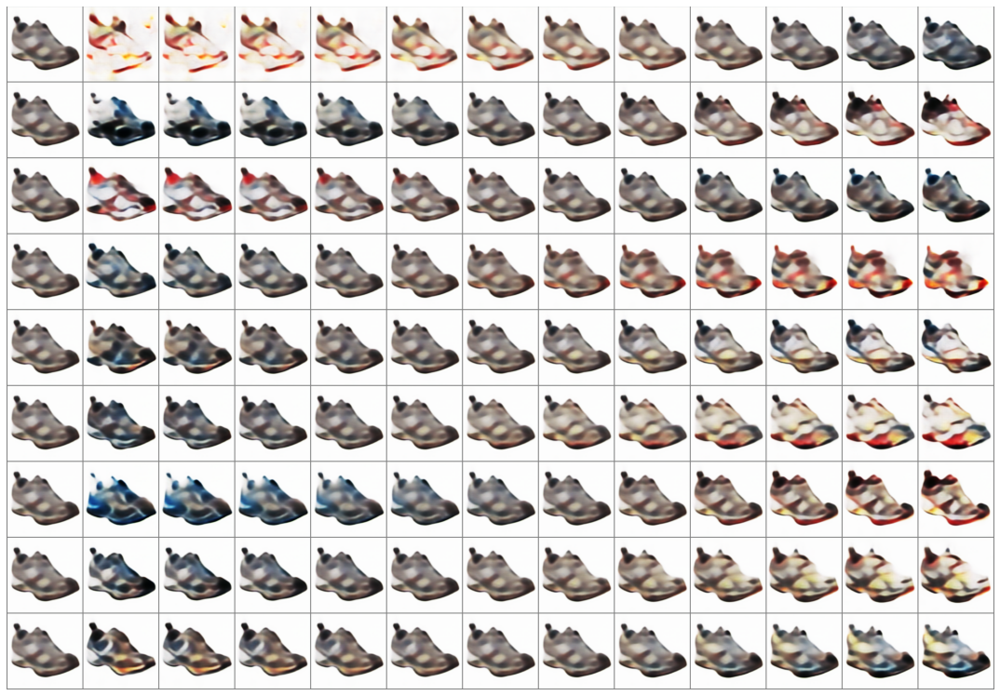

In [ ]:
example_lat = out[50]
grid_n = 13
n=9
topN = get_top_lats(oo[0:499],n=n)

sampled_images = sample_from_latent(learn.model, example_lat, topN,grid_n, save = False)

img = show_image_grid(sampled_images, grid_n = grid_n,decoder = dls.decode)
topN

array([109,  52, 101,  35,  77,   1,  13,  40,   8])

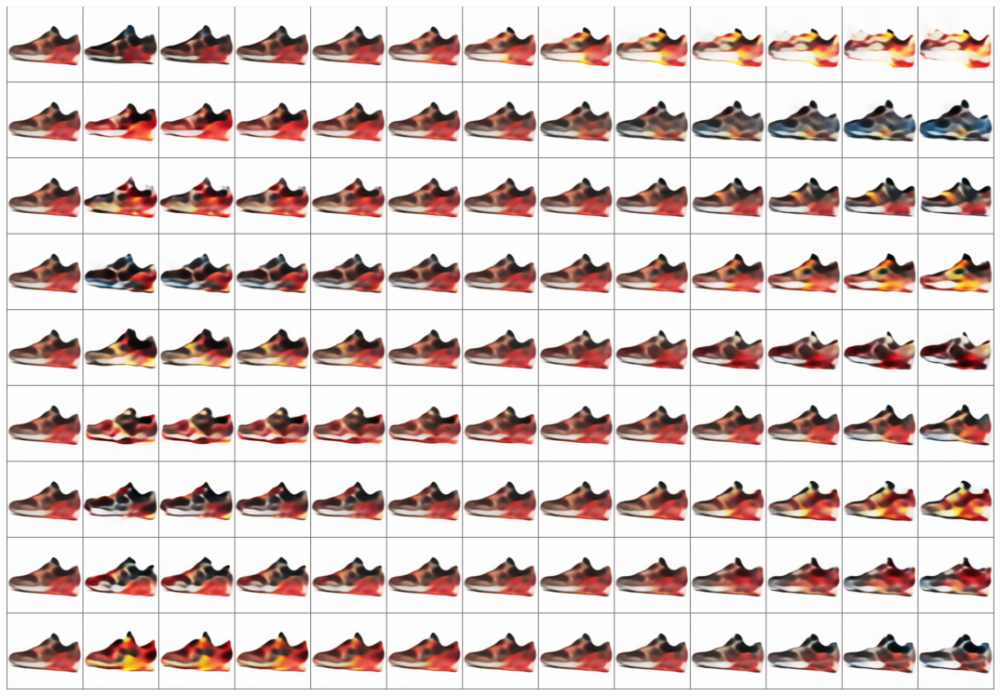

In [ ]:
example_lat = out[500]
grid_n = 13
n=9
topN = get_top_lats(oo[500:999],n=n)

sampled_images = sample_from_latent(learn.model, example_lat, topN,grid_n, save = False)

img = show_image_grid(sampled_images, grid_n = grid_n,decoder = dls.decode)
topN

array([ 42, 109,  77,  49,  54,  17,  74,  16,  56])

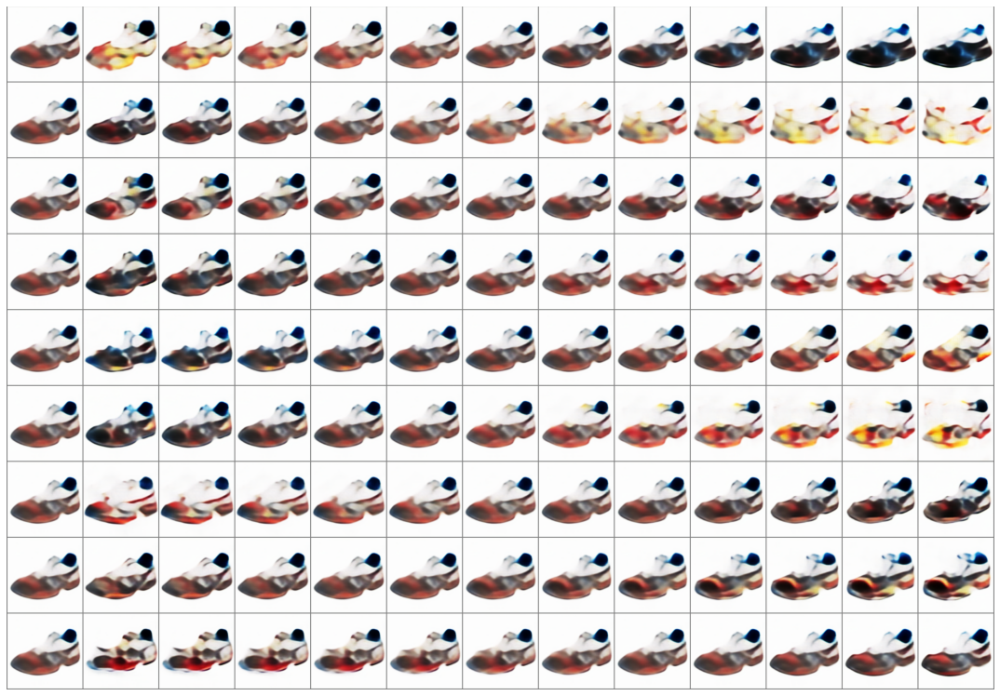

In [ ]:
example_lat = out[1111]
grid_n = 13
n=9
topN = get_top_lats(oo[1000:1499],n=n)

sampled_images = sample_from_latent(learn.model, example_lat, topN,grid_n, save = False)

img = show_image_grid(sampled_images, grid_n = grid_n,decoder = dls.decode)
topN

[<AxesSubplot:>,
 <AxesSubplot:>,
 <AxesSubplot:>,
 <AxesSubplot:>,
 <AxesSubplot:>,
 <AxesSubplot:>,
 <AxesSubplot:>,
 <AxesSubplot:>,
 <AxesSubplot:>,
 <AxesSubplot:>,
 <AxesSubplot:>,
 <AxesSubplot:>,
 <AxesSubplot:>,
 <AxesSubplot:>,
 <AxesSubplot:>]

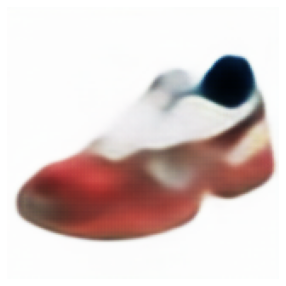

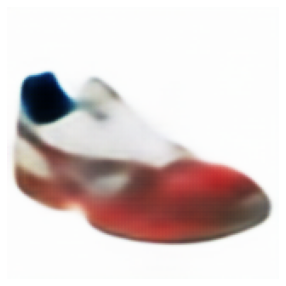

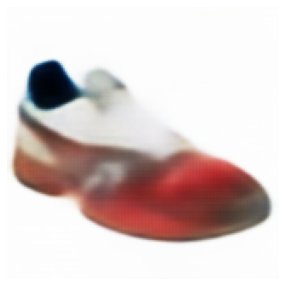

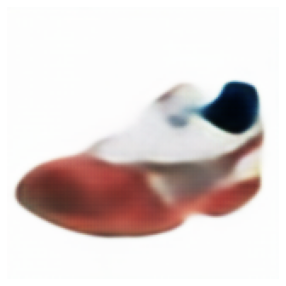

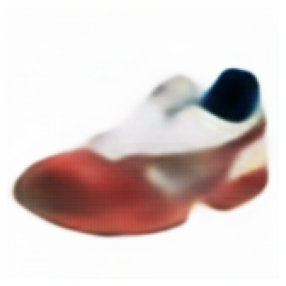

...

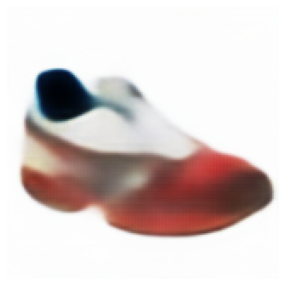

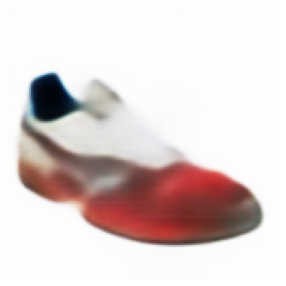

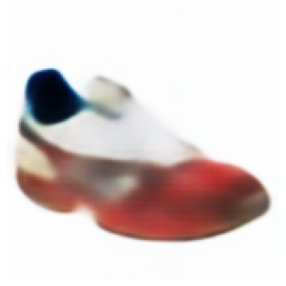

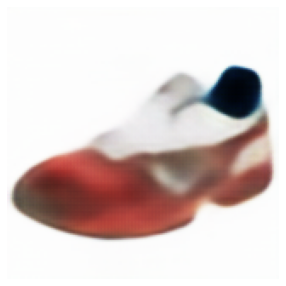

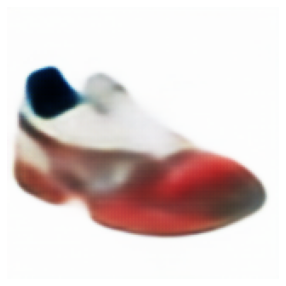

In [ ]:
[dls.decode((outs_.squeeze(),[]))[0][i].squeeze().show() for i in range(1000,1015)]


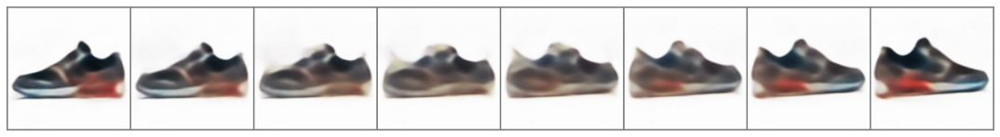

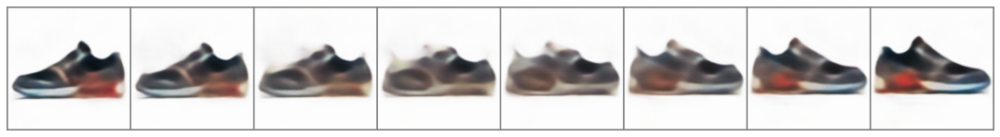

In [ ]:

# traverse_latent(net, latent1, latent2, grid_n = 10,save = True, location = 'grid.png'):

grid_n = 8

lat1 = out[519]
lat2 = out[520]
lat3 = out[521]
traversed_images = traverse_latent(learn.model,lat1,lat2,grid_n)

timg1 = show_image_grid(traversed_images, grid_n = grid_n,decoder = dls.decode)

traversed_images2 = traverse_latent(learn.model,lat3,lat2,grid_n)
timg2 = show_image_grid(traversed_images2, grid_n = grid_n,decoder = dls.decode)


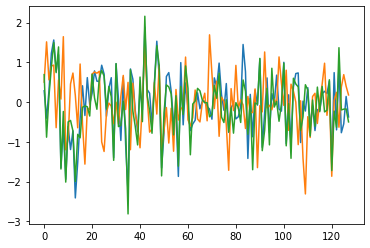

In [ ]:
#plt.plot(out[[0,1]].T)
plt.plot(oo[[519,520,521],].squeeze().T)

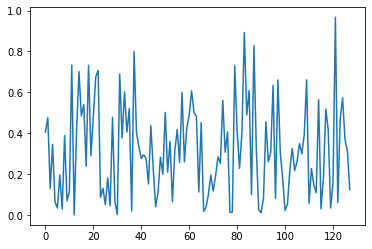

In [ ]:

plt.plot((oo[519]-oo[521]).__abs__().squeeze())

[<AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>]

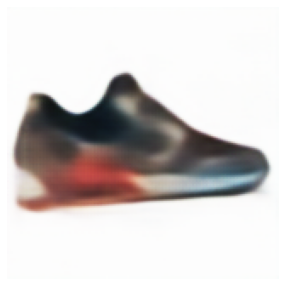

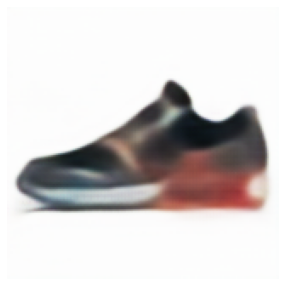

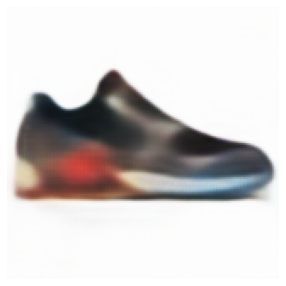

In [ ]:
[dls.decode((outs_.squeeze(),[]))[0][i].squeeze().show() for i in range(519,522)]


[<AxesSubplot:>,
 <AxesSubplot:>,
 <AxesSubplot:>,
 <AxesSubplot:>,
 <AxesSubplot:>,
 <AxesSubplot:>,
 <AxesSubplot:>,
 <AxesSubplot:>,
 <AxesSubplot:>,
 <AxesSubplot:>,
 <AxesSubplot:>,
 <AxesSubplot:>,
 <AxesSubplot:>,
 <AxesSubplot:>,
 <AxesSubplot:>,
 <AxesSubplot:>,
 <AxesSubplot:>,
 <AxesSubplot:>,
 <AxesSubplot:>]

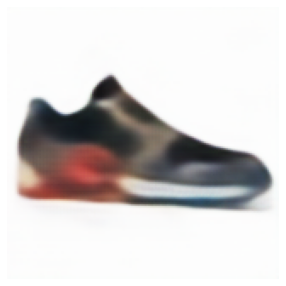

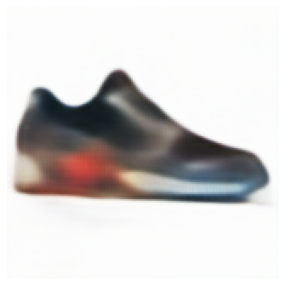

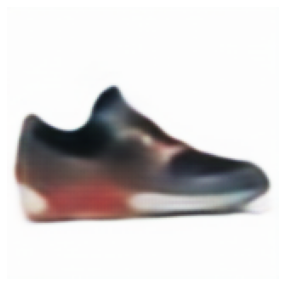

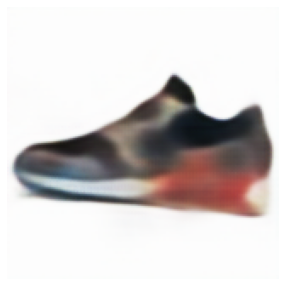

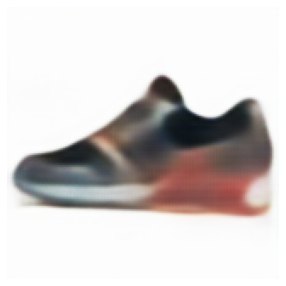

...

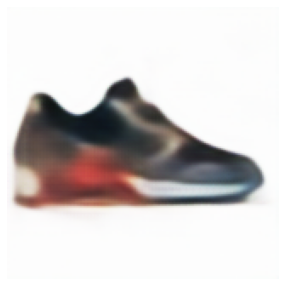

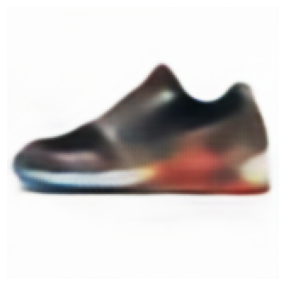

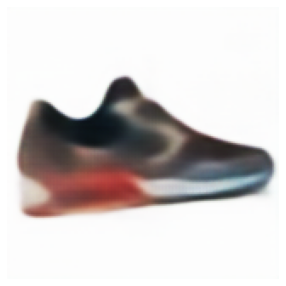

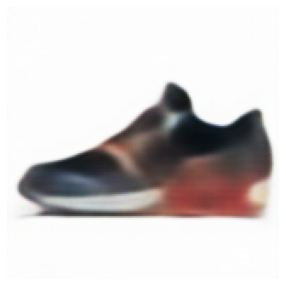

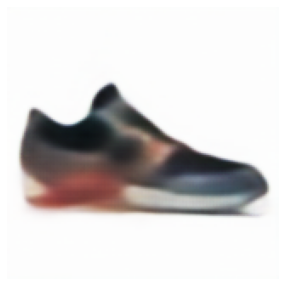

In [ ]:
[dls.decode((outs_.squeeze(),[]))[0][i].squeeze().show() for i in range(516,535)]


In [ ]:
mmd = np.array(mmd_loss)
loss = np.array(pix_loss)

paths = df.iloc[learn.dls[0].get_idxs()].path.values

print(f"packing {batchn} batches into dataframe")
#idxs = learn.dls[0].get_idxs()
#store all relevant info in a pandas datafram 
df_feats = pd.DataFrame({"path": paths, "features":out, "loss":loss, "mmd":mmd})

In [ ]:
ii = np.unique(ogidx)
#ogidx==pic

ids = np.where(ogidx==ii[0])
ids[0].shape,lats[ids].shape,lats.shape


lats.mean()

-0.015257614

In [ ]:
feats0=df_features.iloc[pic].features

l=lats[ids]-feats0
l.shape

NameError: name 'pic' is not defined

In [ ]:
feats0 = np.stack(df_features.features)


ml=[]
sl=[]

for pic in ii:
    #np.select(lats,ogidx==pic)
    ids = np.where(ogidx==pic)
    feats0=df_features.iloc[pic].features
    #mn_feat = np.where()
    l=lats[ids]-feats0
    ml.append(l.mean(axis=0))
    sl.append(l.std(axis=0))
   

In [ ]:
ml[0].shape

nml = np.stack(ml).squeeze()
nsl = np.stack(sl).squeeze()
zz = nml/nsl


# average Z score relative to "non- augmented"




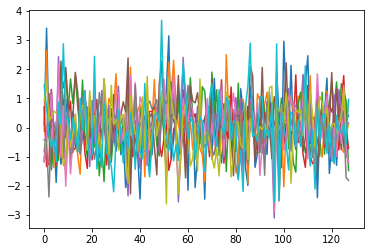

In [ ]:
plt.plot(zz.T)

FAST AI    
```python

    def get_preds(self, ds_idx=1, dl=None, with_input=False, with_decoded=False, with_loss=False, act=None,
                  inner=False, reorder=True, cbs=None, **kwargs):
        if dl is None: dl = self.dls[ds_idx].new(shuffled=False, drop_last=False)
        else:
            try: len(dl)
            except TypeError as e:
                raise TypeError("`dl` is something other than a single `DataLoader` object")
        if reorder and hasattr(dl, 'get_idxs'):
            idxs = dl.get_idxs()
            dl = dl.new(get_idxs = _ConstantFunc(idxs))
        cb = GatherPredsCallback(with_input=with_input, with_loss=with_loss, **kwargs)
        ctx_mgrs = self.validation_context(cbs=L(cbs)+[cb], inner=inner)
        if with_loss: ctx_mgrs.append(self.loss_not_reduced())
        with ContextManagers(ctx_mgrs):
            self._do_epoch_validate(dl=dl)
            if act is None: act = getattr(self.loss_func, 'activation', noop)
            res = cb.all_tensors()
            pred_i = 1 if with_input else 0
            if res[pred_i] is not None:
                res[pred_i] = act(res[pred_i])
                if with_decoded: res.insert(pred_i+2, getattr(self.loss_func, 'decodes', noop)(res[pred_i]))
            if reorder and hasattr(dl, 'get_idxs'): res = nested_reorder(res, tensor(idxs).argsort())
            return tuple(res)
        self._end_cleanup()
```

FASTINFERENCE    
    
```python
def get_preds(self:Learner, ds_idx=1, dl=None, with_input=False, with_decoded=False, with_loss=False, raw=False, act=None,
                inner=False, reorder=True, cbs=None, **kwargs):
    if dl is None: dl = self.dls[ds_idx].new(shuffled=False, drop_last=False)
    if reorder and hasattr(dl, 'get_idxs'):
        idxs = dl.get_idxs()
        dl = dl.new(get_idxs = _ConstantFunc(idxs))
    cb = GatherPredsCallback(with_input=with_input, with_loss=with_loss, **kwargs)
    ctx_mgrs = self.validation_context(cbs=L(cbs)+[cb], inner=inner)
    if with_loss: ctx_mgrs.append(self.loss_not_reduced())
    with ContextManagers(ctx_mgrs):
        self._do_epoch_validate(dl=dl)
        if act is None: act = getattr(self.loss_func, 'activation', noop)
        res = cb.all_tensors()
        pred_i = 1 if with_input else 0
        if res[pred_i] is not None:
            res[pred_i] = act(res[pred_i]) if not raw else res[pred_i]
            if with_decoded:
                res.insert(pred_i+2, getattr(self.loss_func, 'decodes', noop)(res[pred_i]))
        if reorder and hasattr(dl, 'get_idxs'): res = nested_reorder(res, tensor(idxs).argsort())
        if with_decoded:
            if hasattr(self.dls, 'categorize'): res[pred_i+1] = apply(getattr(self.dls, 'categorize', noop).decode, [*res[pred_i+2]])
            if hasattr(self.dls, 'multi_categorize'): res[pred_i+1] = apply(getattr(self.dls, 'multi_categorize', noop).decode, [*res[pred_i+2]])
        return tuple(res)
    self._end_cleanup()

    
```

FAST AI    
    
```python
    def predict(self, item, rm_type_tfms=None, with_input=False):
        dl = self.dls.test_dl([item], rm_type_tfms=rm_type_tfms, num_workers=0)
        inp,preds,_,dec_preds = self.get_preds(dl=dl, with_input=True, with_decoded=True)
        i = getattr(self.dls, 'n_inp', -1)
        inp = (inp,) if i==1 else tuplify(inp)
        dec = self.dls.decode_batch(inp + tuplify(dec_preds))[0]
        dec_inp,dec_targ = map(detuplify, [dec[:i],dec[i:]])
        res = dec_targ,dec_preds[0],preds[0]
        if with_input: res = (dec_inp,) + res
        return res
```

FASTINFERENCE    
    
```python
@patch
def predict(x:Learner, item, with_input=False, rm_type_tfms=None):
        dl = x.dls.test_dl([item], rm_type_tfms=rm_type_tfms, num_workers=0)
        res = x.get_preds(dl=dl, with_input=with_input, with_decoded=True)
        return res
```

In [ ]:
dl = learner.dls.test_dl(imgs)
inp, preds,_,dec_preds = learner.get_preds(dl=dl, with_input=True, with_decoded=True)
full_dec = learner.dls.decode_batch((*tuplify(inp),*tuplify(dec_preds)))


NameError: name 'learner' is not defined

In [ ]:
dls.before_batch.decode

<bound method Pipeline.decode of Pipeline: >

In [ ]:
#dls.after_item.decode
dls.after_batch.decode


<bound method Pipeline.decode of Pipeline: IntToFloatTensor -- {'div': 255.0, 'div_mask': 1} -> Flip -- {'size': None, 'mode': 'bilinear', 'pad_mode': 'border', 'mode_mask': 'nearest', 'align_corners': True, 'p': 0.5} -> Brightness -- {'max_lighting': 0.1, 'p': 1.0, 'draw': None, 'batch': False} -> Normalize -- {'mean': tensor([[[[0.5000]],

         [[0.5000]],

         [[0.5000]]]], device='cuda:0'), 'std': tensor([[[[0.5000]],

         [[0.5000]],

         [[0.5000]]]], device='cuda:0'), 'axes': (0, 2, 3)}>

In [ ]:
# dec_batches = []
# dl = learn.dls.test_dl(imgs)
# learn.model.eval()
# with torch.no_grad():
#   for batch in dl:
#     res = learn.model(batch[0])
#     inp = batch[0]
#     dec_batches.append(learn.dls.decode_batch((*tuplify(inp), *tuplify(res))))

In [ ]:
lat = torch.from_numpy(db_feats.mean(axis=0))
latvsd = torch.from_numpy(db_feats.std(axis=0))
eps = torch.rand((1,128,)).cuda()
lat2 = lat[None,].cuda()+latvsd.cuda()*eps
lat.shape

torch.Size([128])

<AxesSubplot:>

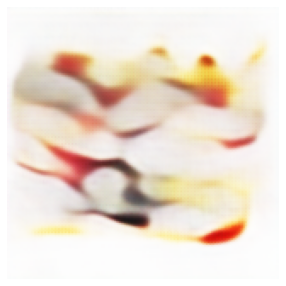

In [ ]:
# lat1 = torch.rand((1,128,)).cuda()
# lat.shape
lat1 = lat[None,].cuda()+2*latvsd[None,].cuda()*torch.rand((1,128,)).cuda()
#lat = torch(ll[0,:]).cuda()
learn.model.eval()
with torch.no_grad():
    outt = learn.model.decode(lat1)
dls.decode((outt.squeeze(),[]))[0].squeeze().show()

<AxesSubplot:>

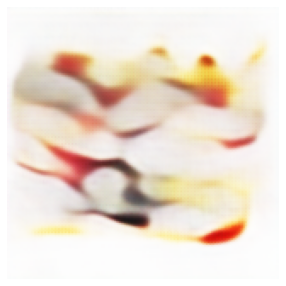

In [ ]:
dls.decode((outt.squeeze(),[]))[0].squeeze().show()

In [ ]:

# export
def get_random_sample(learn):
    #"get encoding, and loss of that encoding"
    outs = []
    pix_loss = []
    mmd_loss = []
    batchn = 0
    #model = learn.model

    lat = np.random.rand(128,)

    
    learn.model.decode()
    with torch.no_grad():
        for imgs,_,_ in learn.dls.train:
            o = learn.model.cuda()(imgs)
            x_hat,latent = o
            z,_ = latent.split(1,dim=2)
            outs.append(to_detach(z))
            recon_err = to_detach(pix_l2_err(x_hat,imgs))
            pix_loss.extend(recon_err)
            reg = to_detach(mmd_vae_reg(z,z_prior=None, device='cuda'))
            mmd_loss.extend(reg)
            batchn += 1

    oo = np.vstack(outs)
    out = [np.array(o) for o in oo] #

    mmd = np.array(mmd_loss)
    loss = np.array(pix_loss)

    paths = df.iloc[learn.dls[0].get_idxs()].path.values

    print(f"packing {batchn} batches into dataframe")
    #idxs = learn.dls[0].get_idxs()
    #store all relevant info in a pandas datafram 
    df_feats = pd.DataFrame({"path": paths, "features":out, "loss":loss, "mmd":mmd})
    return df_feats

In [ ]:
outs = []
inps = []
dl = learner.dls.test_dl(imgs)
learn.model.eval()
with torch.no_grad():
    for batch in dl:
        outs.append(learner.model(batch[0]))
        inps.append(batch[0])

outs = torch.stack(outs)
inps = torch.stack(inps)
dec = learner.dls.decode_batch((*tuplify(inps), *tuplify(outs)))

In [ ]:
out = [np.array(o) for o in oo] #
len(out)

11771

In [ ]:
paths = df.iloc[learn.dls[0].get_idxs()].path.values
oo = np.vstack(outs)
oo.shape

(11648, 128, 1)

In [ ]:
df_feats.head()

,path,features,loss,mmd
0,Shoes/Sneakers and Athletic Shoes/Bikkembergs/8032236.42604.jpg,"[[0.7662898], [0.19693464], [0.14867085], [0.29259357], [0.39290968], [-0.048824403], [-0.99053216], [1.1727526], [0.2315073], [2.0280826], [-0.026153594], [1.2476509], [-0.75304085], [0.52350897], [0.69870794], [-0.53762424], [0.25222588], [-1.0048642], [-0.20318161], [0.9565835], [0.015361315], [-0.56184703], [1.7974694], [0.20565115], [-0.84259635], [-0.9523454], [-0.23662937], [-1.2576205], [-0.58959174], [0.4631196], [0.2579683], [-0.12979916], [0.124259554], [1.2988214], [0.6741075], [1.2459118], [-1.1303828], [-0.34981045], [-0.61749834], [0.23222296], [-0.047606956], [-0.012371052]...",0.010221,0.002264
1,Shoes/Sneakers and Athletic Shoes/BOSS Orange/8107575.3.jpg,"[[0.2030072], [0.63588834], [0.14012446], [-2.340124], [-0.06361613], [-0.097402684], [-0.4323328], [-0.4500668], [0.34977242], [1.2415851], [-0.5654025], [0.32334223], [0.17628446], [-0.3145145], [0.33928794], [0.07850086], [-0.10712481], [-1.1315001], [0.58587396], [0.23992375], [0.25422603], [-0.43561578], [0.5750515], [0.27002758], [0.26529408], [-0.6576608], [0.32377616], [-0.40473488], [0.04692069], [0.9600749], [-0.7964427], [-0.39632967], [0.29050925], [-0.16069686], [0.08734232], [1.3719891], [-0.7297886], [0.23052768], [0.20232345], [-0.048046723], [-0.44617283], [-0.34634474], [...",0.017440,0.003306
2,Shoes/Sneakers and Athletic Shoes/Gravis/7737176.3923.jpg,"[[0.021234864], [-0.2918953], [-0.19157684], [-1.3417245], [-0.2507347], [0.28426173], [-0.69796765], [-0.11199567], [-0.15376052], [1.1005245], [-0.35360143], [1.2411591], [0.20056418], [-0.7931664], [0.042467214], [-0.63406587], [-0.6674843], [-2.2506337], [0.09840395], [-0.36179632], [0.2075078], [-0.3976888], [1.3325136], [-0.08010124], [0.06219032], [-0.9224486], [-0.03152731], [-0.43009308], [-0.10739353], [-0.28819415], [-0.25990286], [0.65803117], [0.87428826], [-0.33533525], [-0.22865874], [1.0232524], [-0.12868969], [0.10226578], [0.7130797], [0.010103308], [-0.23953088], [-0.217...",0.006500,0.004358
3,Shoes/Sneakers and Athletic Shoes/Tecnica/7902136.163266.jpg,"[[-0.21704991], [-0.07640613], [0.1080479], [-1.851172], [0.31154123], [-0.41887173], [-0.83714205], [-0.073411435], [0.55311346], [0.54200155], [-0.11134504], [0.05099593], [0.17274377], [-0.446937], [0.0109729525], [0.022477128], [-0.45204443], [-1.3424857], [-0.33135048], [-0.22305453], [-0.096386395], [-0.1516438], [0.23771946], [0.042271566], [0.3446856], [-0.08518638], [-0.05276902], [-0.516865], [0.19451116], [0.65379155], [-0.11331241], [-0.047025584], [0.85912275], [-0.342738], [-0.27528486], [1.4208378], [-0.8082885], [0.19494522], [-0.65032184], [-0.12621695], [-0.53117365], [-0...",0.021152,0.000976
4,Shoes/Sneakers and Athletic Shoes/The North Face/7896070.328340.jpg,"[[1.4513763], [0.2258437], [0.187713], [-1.6642098], [0.5768743], [0.5519211], [-1.1355019], [0.64817446], [0.092292756], [0.89363056], [-0.02143997], [0.6934017], [0.24890754], [0.5207272], [0.5367015], [-0.12656452], [0.36497816], [-0.790845], [0.14622045], [0.27212277], [-0.40496644], [0.21840109], [0.014022678], [-0.33332098], [0.2694107], [-0.89212096], [0.41307035], [-0.21044096], [-0.5096438], [-0.32899952], [-0.02089359], [-0.41678175], [-0.04786148], [-0.084352985], [-0.27735743], [1.06378], [0.4270153], [0.39375708], [0.2405939], [-0.11971905], [-0.39817914], [-0.41593713], [0.47...",0.018274,0.002256


In [ ]:
#kk = learn.dls.train.one_batch()
df.path(learn.dls[0].get+)
#learn.dls[0].gitattributes

AttributeError: vocab

In [ ]:
type_tfms = [PILImage.create]
item_tfms = [Resize(224), ToTensor()]
type_pipe = Pipeline(type_tfms)
item_pipe = Pipeline(item_tfms)
norm = Normalize.from_stats(*imagenet_stats)
i2f = IntToFloatTensor()


batches = []
batch = []
outs = []
inps = []
k = 0
for im in im_names:
    batch.append(item_pipe(type_pipe(im)))
    k += 1
    if k == 50:
        batches.append(torch.cat([norm(i2f(b.cuda())) for b in batch]))
        batch = []
        k = 0

learner.model.eval()
with torch.no_grad():
    for b in batches:
        outs.append(learner.model(b))
        inps.append(b)

inp = torch.stack(inps)
out = torch.stack(outs)
dec = learner.dls.decode_batch((*tuplify(inp), *tuplify(out)))

In [ ]:
df.path

0        Shoes/Sneakers and Athletic Shoes/ALDO/8045616.9.jpg
1        Shoes/Sneakers and Athletic Shoes/ALDO/8045632.9.jpg
2        Shoes/Sneakers and Athletic Shoes/ALDO/8045650.3.jpg
3        Shoes/Sneakers and Athletic Shoes/ALDO/8045650.9.jpg
4        Shoes/Sneakers and Athletic Shoes/ALDO/8093302.3.jpg
                                 ...                         
11766                              scraped/sns/eb4f3eada8.jpg
11767                              scraped/sns/5dace85f70.jpg
11768                              scraped/sns/2a18731113.jpg
11769                              scraped/sns/9cb275f3aa.jpg
11770                              scraped/sns/6d6c0b7b97.jpg
Name: path, Length: 11771, dtype: object

In [ ]:
test_dl = learn.dls.train
#predictions = learn.get_preds(dl=test_dl,with_decoded=True,reorder=False)

inp,preds,mabye_act,dec_preds = learn.get_preds(dl=test_dl, with_input=True, with_decoded=True,reorder=False)
# i think the third return is "activated"

In [ ]:
df.iloc[learn.dls[0].get_idxs()]

,path,train,test,validate,t_t_v,is_valid
1505,Shoes/Sneakers and Athletic Shoes/DVS Shoe Company/7740222.377702.jpg,True,False,False,train,False
10305,scraped/goat/958588ab06.jpg,True,True,False,test,True
2357,Shoes/Sneakers and Athletic Shoes/Habitat/7705388.6654.jpg,False,False,True,valid,True
11735,scraped/sns/12ca051868.jpg,True,False,False,train,False
2491,Shoes/Sneakers and Athletic Shoes/K-Swiss/7973126.151.jpg,True,False,False,train,False
...,...,...,...,...,...,...
2800,Shoes/Sneakers and Athletic Shoes/Lacoste/8050355.379450.jpg,True,False,False,train,False
4963,Shoes/Sneakers and Athletic Shoes/Nike/8064872.385465.jpg,True,False,False,train,False
4666,Shoes/Sneakers and Athletic Shoes/Nike/7964967.367475.jpg,False,True,False,test,True
5594,Shoes/Sneakers and Athletic Shoes/PUMA/7976009.151.jpg,True,False,False,train,False


In [ ]:
inp,preds,pred_act,dec_preds = learn.get_preds(ds_idx=0, with_input=True, with_decoded=True,reorder=True)

#pred,dec_preds = learn.get_preds(ds_idx=0, with_input=False, with_decoded=False,reorder=True)

In [ ]:
learn.dls[0].vocab(

AttributeError: vocab

In [ ]:
    outs = []
    clss = []
    paths = []
    batchn = 0

    with torch.no_grad():
        for imgs,classes in dls.train:
            learn.predict(imgs)
            outs.extend(to_detach(conv_net(imgs)))
            clss.extend(to_detach(classes))
            paths.extend( [to_detach(dls[0].vocab[c]) for c in classes])
            batchn += 1
    # not sure why i did this... stack should work.
    out = [np.array(o) for o in outs] #np.stack(to_detach(outs))
    cs = np.stack(clss)
    fn = np.stack(paths)

    print(f"packing {batchn} batches into dataframe")


torch.Size([11771, 3, 160, 160])

In [ ]:
i = getattr(dls, 'n_inp', -1)
inp2 = (inp,) if i==1 else tuplify(inp)  # this just wraps it in a tuple
dec = dls.decode_batch(inp2 + tuplify(dec_preds))[0]


# this just gets nine examples....
dec_inp,dec_targ = map(detuplify, [dec[:i],dec[i:]])
res = dec_targ,dec_preds[0],preds[0]
res = (dec_inp,) + res

(<AxesSubplot:>, <AxesSubplot:>)

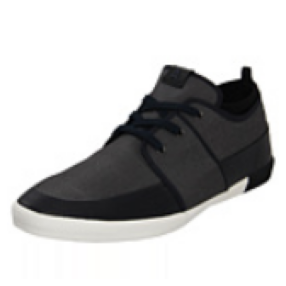

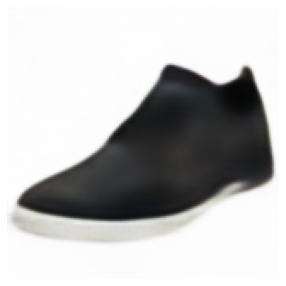

In [ ]:
dec[0].show(),dec[1].show()

In [ ]:
zz = dls.decode_batch(inp2 + tuplify(dec_preds))

(<AxesSubplot:>, <AxesSubplot:>)

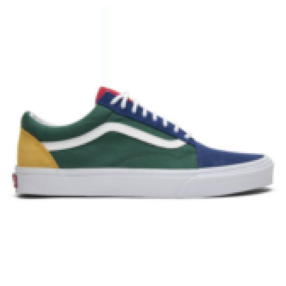

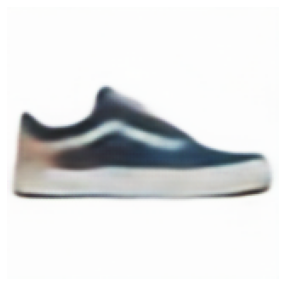

In [ ]:
zz[1][0].show(), zz[1][1].show()

In [ ]:
len(predictions),(predictions[0][0]-predictions[1][0]).mean(),(predictions[2][0]-predictions[0][0]).mean(),

(3, TensorImage(-0.0047), tensor(0.))

In [ ]:
%%time
outs = []
clss = []
paths = []
batchn = 0
#[inp,full_dec,dec,out] = learn.predict(x,with_input=True)
with learn.no_logging(), learn.no_bar():
    for fname in df.path:
        #[inp,full_dec,dec,out] = learn.predict(image_path/fname,with_input=True)
        full_dec,_,_ = learn.predict(image_path/fname)
        #_,latent=full_dec
        latent,_ = full_dec[1].split(1,dim=1)

        outs.append(to_detach(latent.squeeze()))
        #clss.extend(to_detach(classes))
        paths.append(fname)
        batchn += 1


out = [np.array(o) for o in outs] #np.stack(to_detach(outs))

/home/ergonyc/Projects/Project2.0/snkrfinder/nbs/snkrfinder/model/cvae.py:459: RuntimeWarning: Mean of empty slice.
  return np.array(self.vals).mean()
/home/ergonyc/anaconda3/envs/fastai/lib/python3.8/site-packages/numpy/core/_methods.py:170: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


KeyboardInterrupt: 

I need some helper functions to get inference statistics...  Naming is confounding me, so I'll go with `pix_l2_err`, `pix_l1_err`, `kld_vae_reg`, `l1_ae_reg`, `mmd_vae_reg`.  These will return quantites for _every_ entry in the batch.


In [ ]:
x,y,z = learn.dls.one_batch()

x_hat,latents = learn.model.cuda()(x)

In [ ]:
latents.shape

torch.Size([128, 128, 2])

In [ ]:
z,_ = latents.split(1,dim=2)
z.shape

torch.Size([128, 128, 1])

In [ ]:
%%time

mmd_vae_reg(z)
# mmd_vae_reg(z)
# bs = z.size()[0]
# latent_dim = z.size()[1]
# true_samples = torch.randn((bs,latent_dim), requires_grad=False).cuda()
# mmd_loss = _MMD(true_samples, z)
# mmd_loss.shape

CPU times: user 1.51 ms, sys: 4.05 ms, total: 5.56 ms
Wall time: 4.77 ms


tensor(0.0015, device='cuda:0', grad_fn=<SubBackward0>)

In [ ]:
mmd_loss.mean(dim=1).shape

torch.Size([128])

In [ ]:
#[inp,full_dec,dec,out] = learn.predict(x,with_input=True)

outs = []
clss = []
paths = []
batchn = 0
with learn.no_logging(), learn.no_bar():
    for fname in df.path:
        #[inp,full_dec,dec,out] = learn.predict(image_path/fname,with_input=True)
        full_dec,_,_ = learn.predict(image_path/fname)
        #_,latent=full_dec
        latent,_ = full_dec[1].split(1,dim=1)

        outs.append(to_detach(latent.squeeze()))
        #clss.extend(to_detach(classes))
        paths.append(fname)
        batchn += 1

        
#     def decode(self, z):    
#         return self.decoder(z)
    
#     def encode(self, x):
#         h = self.encoder(x)
#         return self.bn(h)
            
#     def forward(self, x):
#         """
#         pass the "latents" out to keep the learn mechanics consistent... 
#         """
#         h = self.encoder(x)
#         z,logvar = self.bn(h)
#         x_reconst = self.decoder(z)                    
#         latents = torch.stack([z,logvar] ,dim=-1)

#         return x_reconst , latents

out = [np.array(o) for o in outs] #np.stack(to_detach(outs))

In [ ]:
print(f"packing {batchn} batches into dataframe")

#store all relevant info in a pandas datafram 
df_lats = pd.DataFrame({"path": paths, "latents":out})

/home/ergonyc/Projects/Project2.0/snkrfinder/nbs/snkrfinder/model/cvae.py:459: RuntimeWarning: Mean of empty slice.
  return np.array(self.vals).mean()
/home/ergonyc/anaconda3/envs/fastai/lib/python3.8/site-packages/numpy/core/_methods.py:170: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


packing 11771 batches into dataframe


In [ ]:
df_lats


,path,latents
0,Shoes/Sneakers and Athletic Shoes/ALDO/8045616.9.jpg,"[[0.7469217], [-1.005324], [0.085089654], [0.96726453], [-0.87263954], [-0.06522734], [0.1683687], [0.652633], [0.13520744], [0.050265398], [-0.05075361], [0.23899871], [-1.0338073], [0.38241076], [0.12256629], [0.20783281], [-1.093574], [-0.5280874], [-1.1472441], [0.86626124], [0.67083883], [0.6296883], [2.4735258], [-0.32527465], [-0.31020996], [-0.041634943], [-0.24646346], [-0.7427729], [-0.25521004], [-0.07875567], [-0.031252407], [-0.43710202], [0.20572528], [-0.61964595], [0.8440358], [1.1766716], [-0.6668982], [0.26838416], [-0.41202095], [-0.46013808], [-0.32803681], [0.5465052],..."
1,Shoes/Sneakers and Athletic Shoes/ALDO/8045632.9.jpg,"[[0.621762], [-1.2458107], [0.47081393], [0.97208697], [-0.5539432], [0.47898024], [0.098615415], [0.66263115], [0.7835178], [-0.13137646], [0.18118912], [0.1135871], [-0.24319959], [0.20622802], [0.5666887], [0.24700364], [0.10725456], [-0.2426985], [-0.80696636], [0.55248076], [0.74313337], [-0.16852513], [0.7488148], [0.16303635], [-0.057421885], [-0.013307434], [0.6634207], [-0.46877787], [0.13789819], [-2.0758944], [-0.39481583], [-0.7601753], [-1.047645], [0.06880796], [0.22470753], [1.1686798], [-0.23131207], [0.4113483], [-0.085025266], [-1.2974058], [0.2422753], [-0.7104697], [4.1..."
2,Shoes/Sneakers and Athletic Shoes/ALDO/8045650.3.jpg,"[[0.25491506], [-0.26849005], [-0.4182725], [0.010009399], [-0.93047523], [-0.2643487], [0.40468806], [1.3713397], [1.1237102], [1.4155008], [-0.6602012], [0.78647494], [-0.4983903], [0.76532096], [-0.099346906], [0.14668204], [0.3285836], [-0.16933033], [-0.6248658], [1.3682305], [-0.1530744], [0.63431484], [1.2873999], [0.3529619], [0.014172717], [0.41830978], [0.28972167], [0.21230283], [-0.117825076], [-0.6525261], [0.5140819], [-1.2173624], [0.20984006], [0.12377243], [0.62873], [2.5526094], [-0.44573385], [-0.6095092], [-0.99272674], [-0.52942485], [-0.14541885], [0.10754444], [2.004..."
3,Shoes/Sneakers and Athletic Shoes/ALDO/8045650.9.jpg,"[[-0.26331553], [-0.24130806], [-0.8843946], [-0.14373572], [-0.51546985], [-0.20946321], [0.4044658], [1.0874192], [1.4814193], [0.9072232], [-0.5418389], [0.20471445], [-0.07630704], [1.0876942], [-0.30256286], [0.12814383], [-0.2724208], [-0.3896189], [-0.23302422], [0.70057356], [-0.23994748], [0.7252731], [1.2475835], [0.298095], [-0.17092289], [0.81999445], [0.5302296], [0.41548863], [0.1842036], [-0.7003789], [0.47753504], [-1.0653465], [-0.03696292], [0.3709252], [0.31083488], [2.393691], [-0.22393873], [-0.48229063], [-0.9843336], [-0.69620013], [-0.3526798], [0.55115604], [2.5387..."
4,Shoes/Sneakers and Athletic Shoes/ALDO/8093302.3.jpg,"[[2.0261292], [-0.39878255], [0.39945093], [-0.95304585], [-0.42878443], [0.6904776], [-1.9299784], [1.2725846], [0.090470076], [2.1517544], [0.7013165], [0.5330539], [-0.07702174], [0.40247214], [0.2887329], [-0.3151209], [0.7308025], [-0.5523744], [-0.24033763], [0.52410024], [0.26611724], [-0.5754356], [0.2865583], [-0.050911658], [0.043028038], [0.25796965], [0.2183871], [-0.69225454], [-0.7275905], [-1.1005578], [0.23302221], [-0.8120145], [-0.023900295], [-0.13457221], [0.17759986], [1.5138538], [0.03848471], [-0.16572124], [0.34406447], [0.24446633], [0.3803098], [-1.3319949], [2.72..."
...,...,...
11766,scraped/sns/eb4f3eada8.jpg,"[[1.1046426], [-0.13181165], [-0.0068744533], [1.2897182], [-0.17140895], [1.0564965], [1.8586993], [-1.8791397], [-0.3656981], [-1.4024692], [0.95261], [1.6232815], [0.17376116], [-2.2998724], [-0.63876224], [-0.2593389], [0.29982197], [-0.44669026], [-0.64075], [-0.7579379], [-0.14319853], [-0.60465544], [-0.49231696], [0.5602868], [0.82936543], [0.25780514], [0.5992304], [0.3228738], [-0.18901843], [-1.3864403], [0.4740652], [-0.20189193], [-0.07610815], [-0.29919797], [-0.85335386], [-3.4823442], [1.2571845], [-0.96297705], [-0.19874874], [-0.6022805], [-0.16600335], [-0.639917], [0.74..."
11767,scraped/sns/5dace85f70.jpg,"[[0.9262267], [0.039

In [ ]:
# full_dec,_,_ = learn.predict(image_path/fname)
# _,latent=full_dec
# latent

out = [np.array(o) for o in outs] #np.stack(to_detach(outs))
len(out)
out[0].shape

(128, 1)

(<AxesSubplot:>, <AxesSubplot:>)

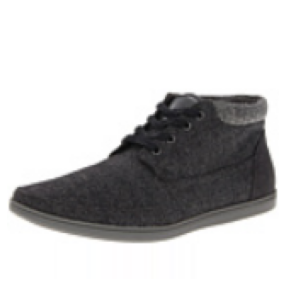

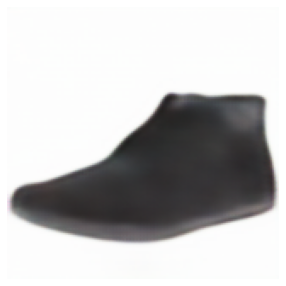

In [ ]:
#latent,_ = full_dec[1].split(1,dim=1)
#to_detach(latent.shape)
inp.show(),full_dec[0].show()

In [ ]:

# export
def get_vae_encodings_df(df,learn):
    "get encoding, and loss of that encoding"
    outs = []
    clss = []
    paths = []
    batchn = 0

    with torch.no_grad():
        for imgs,classes in learn.dls.train:
            learn.predict(imgs)
            outs.extend(to_detach(conv_net(imgs)))
            clss.extend(to_detach(classes))
            paths.extend( [to_detach(dls[0].vocab[c]) for c in classes])
            batchn += 1
    # not sure why i did this... stack should work.
    out = [np.array(o) for o in outs] #np.stack(to_detach(outs))
    cs = np.stack(clss)
    fn = np.stack(paths)

    print(f"packing {batchn} batches into dataframe")

    #store all relevant info in a pandas datafram 
    df_feats = pd.DataFrame({"path": fn, "classes":cs, "features":out})
    return df_feats


####

learn.predict(imgs)
[inp,full_dec,dec,out] = learn.predict(im1,with_input=True)
latent,_ = full_dec[1].split(1,dim=1)
latent

In [ ]:
# #export
# # 


# # block = get_ae_DataBlock(aug=True)
# # block.summary(df)



# export
def get_vae_encodings_df(dls,conv_net):
    """run batches of random "augentations" to assess coding fidelity"""
    outs = []
    clss = []
    paths = []
    batchn = 0

    with torch.no_grad():
        for imgs,classes in dls.train:
            outs.extend(to_detach(conv_net(imgs)))
            clss.extend(to_detach(classes))
            paths.extend( [to_detach(dls[0].vocab[c]) for c in classes])
            batchn += 1
    # not sure why i did this... stack should work.
    out = [np.array(o) for o in outs] #np.stack(to_detach(outs))
    cs = np.stack(clss)
    fn = np.stack(paths)

    print(f"packing {batchn} batches into dataframe")

    #store all relevant info in a pandas datafram 
    df_feats = pd.DataFrame({"path": fn, "classes":cs, "features":out})
    return df_feats


####

def get_feats_df(dls,conv_net):
    outs = []
    clss = []
    paths = []
    batchn = 0

    with torch.no_grad():
        for imgs,classes in dls.train:
            outs.extend(to_detach(conv_net(imgs)))
            clss.extend(to_detach(classes))
            paths.extend( [to_detach(dls[0].vocab[c]) for c in classes])
            batchn += 1
    # not sure why i did this... stack should work.
    out = [np.array(o) for o in outs] #np.stack(to_detach(outs))
    cs = np.stack(clss)
    fn = np.stack(paths)

    print(f"packing {batchn} batches into dataframe")

    #store all relevant info in a pandas datafram 
    df_feats = pd.DataFrame({"path": fn, "classes":cs, "features":out})
    return df_feats


In [ ]:

#learn.export(fname = f"{fname}export.pkl")

Path('models/frozen-MMDVae-TMP-latent128-resblock-alpha10_2021-03-24_10.15.31.pth')

#Path('models/frozen-MMDVae-TMP-latent128-resblock-alpha20_2021-03-24_11.36.20.pth')

fname = Path('models/frozen-MMDVae-TMP-latent64-resblock-alpha10_2021-03-24_12.57.06.pth')
fname = Path('exports/frozen-MMDVae-TMP-latent64-resblock-alpha10_2021-03-24_12.57.06.pkl')
#Path('models/frozen-MMDVae-TMP-latent64-resblock-alpha10_2021-03-24_14.17.51.pth')
fname = Path('exports/MMDVae-A-latent128-resblock-alpha20_2021-03-26_19.35.59.pkl')
learn = load_learner(fname)

In [ ]:

block = get_ae_DataBlock(aug=True,im_size=160)
latent_dim = 128

# cbs = [AnnealedLossCallback(),TerminateOnNaNCallback(),         
#                SaveModelCallback(fname=datetime.now().strftime('%Y-%m-%d %Hh%M.%S'), every_epoch=True),
#                ParamScheduler({'kl_weight': SchedNo(1.,1.) })]
cbs = [AnnealedLossCallback(),TerminateOnNaNCallback(), ShowGraphCallback(),        
               ParamScheduler({'kl_weight': SchedNo(1.,1.) })]

alpha = 20
# note that alpha needs to be adjusted to scale MMD regularizer compared to error for batchmean=true
#.  e.g.  *= 3*IMG_SIZE**2/latent_dim
batchmean = True
useL1 = False
hidden_dim = None

metrics = default_MMEVAE_metrics(alpha,batchmean,useL1)

batch_size = 128
dls = block.dataloaders(df, batch_size=batch_size)

arch='resblock'
vae = ResBlockAE(get_resblockencoder_parts(arch), hidden_dim=hidden_dim,latent_dim=latent_dim,  im_size=IMG_SIZE,out_range=OUT_RANGE)
  
# let beta be calculated by : 3*im_size*im_size/latent_dim
loss_func = MMDLoss(batchmean=batchmean,alpha=alpha,useL1=False)

learn = Learner(dls, vae, cbs=cbs,loss_func=loss_func, metrics=metrics,splitter=AE_split)#.to_fp16() #wd=config['wd'],opt_func=ranger,
     
    
    
learn.load('MMDVae-A-latent128-resblock-alpha20_2021-03-26_19.35.59')

In [ ]:
QUERY_IM = "Shoes/Sneakers and Athletic Shoes/Nike/7716996.288224.jpg"

im1 = image_path/QUERY_IM
im2 = QUERY_IM2

#out = learn.predict(im2)



TypeError: __call__() missing 1 required positional argument: 'event_name'

<AxesSubplot:>

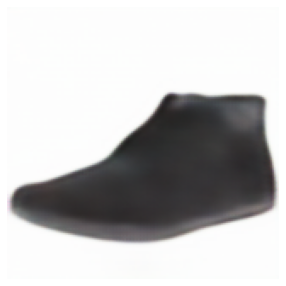

In [ ]:
full_dec[0].show()

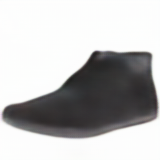

In [ ]:
PILImage.create(full_dec[0])

In [ ]:
img_hat,latent = out[0]

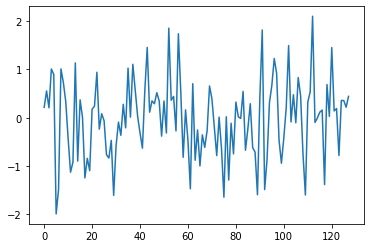

In [ ]:
[inp,full_dec,dec,out] = learn.predict(im1,with_input=True)
latent,_ = full_dec[1].split(1,dim=1)
latent
plt.plot(latent)

In [ ]:
b = learn.dls[1].one_batch()
input_img, targets,_ = to_detach(b)
preds, targs = learn.get_preds(dl=[b], reorder=False)

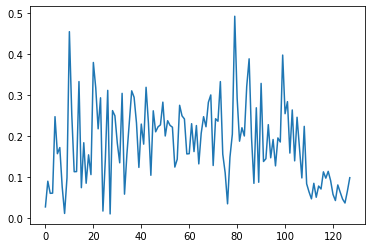

In [ ]:
mse = ((preds[0]-input_img)**2).mean(dim=(1,2,3))

latents = preds[1].split(1,dim=2)[0].squeeze()
plt.plot(mse)

In [ ]:
imgs, _ = preds

_, axes = plt.subplots(ncols=1, nrows=10, constrained_layout=True, figsize=(10, 19))
i = 0
for a in axes:
#     a.set_title(nums[i].cpu().item())
    img = torch.cat([input_img.clamp(0,1), targs, imgs], dim=3)[i].squeeze(0).cpu()
    a.imshow(img, cmap='Greys')
    a.axis('off')
    i = i + 1

##  mobilenet v2

We will use Google's mobileNetV2 trained on ImageNet loaded from torchvision to embed our sneakers into a feature space.  

### decapitate mobilnet_v2 (neuter)

Because we simply want to collect the _features_ output from the model rather than do classification (or some other decision) I replaced the clasiffier _head_ with a simple identity mapper.   The simple Identity nn.Module class makes this simple.

Finally, since we are calculating the features, or _embedding_ over 30k images with the net lets load the computations onto our GPU.  We need to remember to do this in evaluation mode so Batch Norm / Dropout layers are disabled.  [I forgot to do this initally and lost hours trying to figure out why i wasn't getting consistent results]. Setting `param.requires_grad = False` saves us memory since we aren't going to fit any weights for now, and protects us in case we forget to do a `with torch.no_grad()` before inference.

Later when we use the full FastAI API this should all be handled elegantly behind the scenes

In [ ]:
#export

def get_cuda():
    """ try to load onto GPU""" 
    return torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
    
def get_cpu():
    """
    set device to cpu.
    """
    return torch.device("cpu")

This function neuters the mobilenet v2 and pools the output with avg/max across the spatial dimension using torch calls.  

In [ ]:
#export
class AdaptiveConcatPoolFlat(nn.Module):
    """
    torch implimentation of fastai's ConcatPool with a flattend output
    """
    def __init__(self):
        super().__init__()
        self.ap = nn.AdaptiveAvgPool2d((1,1))
        self.mp = nn.AdaptiveMaxPool2d((1,1))

    def forward(self, x): 
        return torch.cat([self.mp(x), self.ap(x)], 1).view(x.shape[0],-1)

def get_mnetV2_feature_net(to_cuda=False):    
    # we want to collapse the features across spatial dimension
    
    device = get_cuda() if to_cuda else get_cpu()

    arch  = torchvision.models.mobilenet_v2(pretrained=True)       
    #     # simply grafting into the "classifier" doesn't play nice with the torchvision
    #     mnetv2.classifier = MyAdaptiveConcatPoolFlat()   
    
    #so we need to recast it:
    features = nn.Sequential(*list(arch.children())[0])
    mnet = nn.Sequential(features, AdaptiveConcatPoolFlat()).to(device)
    
    mnet.eval()  # force it to eval mode to turn off batchnorm/dropout

    # just incase we forget the no_grad()
    for param in mnet.parameters():
        param.requires_grad = False

    mnet.name = arch.__class__.__name__
    return mnet

This function neuters the fastai resnet18 and pools the output with avg/max across the spatial dimension using low-level fastai api torch wrappers.  

In [ ]:
#export

def get_rnet_feature_net(to_cuda=False):    
    # there's also a create_body create_head fastai builtin helper
    arch,cut = xresnet18(pretrained=True),-4
    model = nn.Sequential(*list(arch.children())[:cut],
                               AdaptiveConcatPool2d(),
                               Flatten())
    
    device = get_cuda() if to_cuda else get_cpu()

    model = model.to(device)
    model.eval()  # force it to eval mode to turn off batchnorm/dropout

    # just incase we forget the no_grad()
    for param in model.parameters():
        param.requires_grad = False
        
    model.name = 'resnet18'
    return model




## Fully using the fastAI API makes it even simpler!

I just need to figure out how / if to pool the spatial dimensions of the feature extractor... and double check what the mvnetv2 actuall does in my instattiation.

In [ ]:
# # export
# # copied the split and cut from denseness ... need to check if the splits and cut make sense
# def _mobilenet_v2_split(m:torch.nn.Module): 
#     return L(m[0][0][:7],m[0][0][7:], m[1:]).map(params)
# # avoid underscore mobilenet_v2_meta to make sure it imports correctly
# mobilenet_v2_meta   = {'cut':-1, 'split':_mobilenet_v2_split, 'stats':imagenet_stats}

# model_meta[torchvision.models.mobilenet_v2] = {**mobilenet_v2_meta}

# export
def create_cnn_featurenet(archname,cut=None, to_cuda=False): 
    "archname as string,e.g. mobilenet_v2, resnet, xresnet, etc"
    # one line to make the model
    
    arch = torchvision.models.mobilenet_v2 if archname.startswith('mobilenet') else eval(archname)
    
    model = create_cnn_model(arch,cut,custom_head=nn.Sequential(AdaptiveConcatPool2d(),Flatten()) ) 

    device = get_cuda() if to_cuda else get_cpu()
    model = model.to(device)
    model.eval()  # force it to eval mode to turn off batchnorm/dropout

    # just incase we forget the no_grad()
    for param in model.parameters():
        param.requires_grad = False
        
    model.name = archname
    return model

We should probably set up our dataloaders to load all of the data into the 'valid'.  Then we don't need to worry about the `Resize()` function doing random stuff.

This creates the right indices to get an empty `dls.train` and all images in `dls.valid`, but its not happy creating an empty train dls... 
```python
IndexSplitter(df.index.values.tolist())(df),df.shape
```

Turns out this _feature_ of Resize results in a random crop for training contexts, and is a bit of a _bug_ for what I'm doing here.  The rest of the special features of the fastai Resize has compared to coding it with torch makes it worth these hacks.  For now I'll subclass a `FeatsResize` and replace the `before_call()` method which performs the `split_idx` voodoo. 

In [ ]:
# export

class FeatsResize(Resize):
    "Simple Resize with the split_idx hacked to always be in `valid` mode"
    def before_call(self, b, split_idx):
        if self.method==ResizeMethod.Squish: return
        self.pcts = (0.5,0.5)        
        


def zap_get_x(r): return D_ROOT/DBS['zappos']/r['path']
def zap_get_y(r): return r['Category']  # we aren't actually using the category here (see transfer learning)
def zap_get_fname(r): return r['path']

def get_zap_feats_dataloaders(data,batch_size, size, device):
    "get the zappos data ready for feature extraction"
    dblock = DataBlock(blocks=(ImageBlock, CategoryBlock),
                   splitter=IndexSplitter([]),
                   get_x=zap_get_x, 
                   get_y=zap_get_fname,
                   item_tfms=FeatsResize(size, method='pad', pad_mode='border'),
                   batch_tfms=Normalize.from_stats(*imagenet_stats))  # border pads white...
    dls = dblock.dataloaders(data,bs=batch_size,drop_last=False,device=device)
    #since we are just calculating the features for all the data turn off shuffling
    dls.train.shuffle=False
    return dls

In [ ]:
#export

def get_all_feats(dls,model,to_df=False):
    " expect dls to give us sorted (alphabetical)"
    outs = []
    clss = []
    paths = []
    batchn = 0

    with torch.no_grad():
        for imgs,classes in dls.train:
            outs.extend(to_detach(conv_net(imgs)))
            clss.extend(to_detach(classes))
            paths.extend( [to_detach(dls[0].vocab[c]) for c in classes])
            batchn += 1
            

    feats = np.stack(outs)
    cs = np.stack(clss)
    fns = np.stack(paths)
    print(f"processed {batchn} batches")
    return feats,cs,fns

In [ ]:
# export
def get_feats_df(dls,conv_net):
    outs = []
    clss = []
    paths = []
    batchn = 0

    with torch.no_grad():
        for imgs,classes in dls.train:
            outs.extend(to_detach(conv_net(imgs)))
            clss.extend(to_detach(classes))
            paths.extend( [to_detach(dls[0].vocab[c]) for c in classes])
            batchn += 1
    # not sure why i did this... stack should work.
    out = [np.array(o) for o in outs] #np.stack(to_detach(outs))
    cs = np.stack(clss)
    fn = np.stack(paths)

    print(f"packing {batchn} batches into dataframe")

    #store all relevant info in a pandas datafram 
    df_feats = pd.DataFrame({"path": fn, "classes":cs, "features":out})
    return df_feats

In [ ]:
sz=IMG_SIZES['small']
device = get_cuda()
batch_size = 64

dls = get_zap_feats_dataloaders(df,batch_size,sz,device)
#model = get_mnetV2_feature_net(to_cuda=True)

In [ ]:
df_f = get_feats_df(dls,model)
df_f.head()

NameError: name 'model' is not defined

In [ ]:
# export
def save_feats(df,model,im_size,batch_size=64,f_sfx=''):
    device = get_cuda()
#     # might not need to reduce batch_size if my GPU is _clean_
#     bs = batch_size if im_size<=192 else batch_size//2
    dls = get_zap_feats_dataloaders(df,batch_size,im_size,device)
    df_f = get_feats_df(dls,model)
    # save it
    filename = f"{model.name}-features_{f_sfx}" #filename = f"mobilenetv2-features_{sz}"
    df_f.to_pickle(f"data/{filename}.pkl")
    del dls


def save_featsXsize(df,model,im_sizes = IMG_SIZES,batch_size=64):
    for i,sz in enumerate(im_sizes):
        im_size = im_sizes[sz]
        print(im_size)
        save_feats(df,model,im_size,batch_size,sz)




In [ ]:
IMG_SIZES


{'small': 128, 'medium': 160, 'large': 224}

In [ ]:
#export
def collate_featsXsize(df,mname,im_sizes=IMG_SIZES,dump=True):
    """
    merge the features from small/med/large\
    im_sizes must be adictionary with a str key and int size
    """
    dfs=[]
    for i,sz in enumerate(im_sizes):
        print(im_sizes[sz])
        filename = f"{mname}-features_{sz}"
        dfs.append(pd.read_pickle(f"data/{filename}.pkl"))

    # this is hard coded for now...with sm,md,lg...
    df_test = pd.merge(dfs[0],dfs[1],how='left',on='path',suffixes=('_sm','_md'))
    df_test = pd.merge(df_test,dfs[2],how='left',on='path')
    df_test = df_test.rename(columns={"classes": "classes_lg", "features": "features_lg"})


    #df2 = df.merge(df_feat)  
    # explicitly:
    df2 = pd.merge(df, df_test,  how='left', on='path')

    # save it
    if dump:
        filename = f"zappos-50k-{mname}-features_"
        df2.to_pickle(f"data/{filename}.pkl")

    df2 = df2.sort_values('path', ascending=True)
    df2 = df2.reset_index(drop=True)
    if dump:
        filename = f"zappos-50k-{mname}-features_sort_3"
        df2.to_pickle(f"data/{filename}.pkl")

    return df2

In [ ]:
# def dump_pickle(filepath, item_to_save):
#     f = open(filepath, "wb")
#     pickle.dump(item_to_save, f)
#     f.close()


# def load_pickle(filepath):
#     infile = open(filepath, "rb")
#     item = pickle.load(infile)
#     infile.close()
#     return item

model = create_cnn_featurenet('mobilenet_v2',to_cuda=True)

In [ ]:
save_featsXsize(df,model)
mnet_df =  collate_featsXsize(df,model.name)

128
packing 432 batches into dataframe
160
packing 432 batches into dataframe
224
packing 432 batches into dataframe
128
160
224


In [ ]:
model = create_cnn_featurenet('resnet18',to_cuda=True)
save_featsXsize(df,model)

rnet_df =  collate_featsXsize(df,model.name)

128
packing 432 batches into dataframe
160
packing 432 batches into dataframe
224
packing 432 batches into dataframe
128
160
224


In [ ]:
model = create_cnn_featurenet('xresnet18',to_cuda=True)
save_featsXsize(df,model)

xrnet_df =  collate_featsXsize(df,model.name)

128
packing 432 batches into dataframe
160
packing 432 batches into dataframe
224
packing 432 batches into dataframe
128
160
224


In [ ]:
model = create_cnn_featurenet('resnet34',to_cuda=True)
save_featsXsize(df,model)
rnet_df =  collate_featsXsize(df,model.name)

model = create_cnn_featurenet('xresnet34',to_cuda=True)
save_featsXsize(df,model)
xrnet_df =  collate_featsXsize(df,model.name)

128
packing 432 batches into dataframe
160
packing 432 batches into dataframe
224
packing 432 batches into dataframe
128
160
224
128
packing 432 batches into dataframe
160
packing 432 batches into dataframe
224
packing 432 batches into dataframe
128
160
224


If we've already calculated everything just load it.

In [ ]:
# hide
model = create_cnn_featurenet('mobilenet_v2',to_cuda=True)
filename = f"zappos-50k-{model.name}-features_sort_3"

df = pd.read_pickle(f"data/{filename}.pkl")
df.head()

,CID,Category,path,path_and_file,Category1,Category2,Filename,Sneakers,Boots,Shoes,...,train,test,validate,t_t_v,classes_sm,features_sm,classes_md,features_md,classes_lg,features_lg
0,7965307-5291,Boots,Boots/Ankle/A. Testoni/7965307.5291.jpg,"[Boots, Ankle, A. Testoni, 7965307.5291.jpg]",Boots,Ankle,7965307.5291.jpg,False,True,False,...,True,False,False,train,0,"[1.5173877, 1.7941849, 1.5046086, 2.5146945, 0.9989279, 0.0, 4.229336, 4.024863, 0.5810505, 0.0, 1.4931862, 0.0, 0.0, 0.037859537, 3.3468304, 1.8166317, 3.428187, 1.5773265, 1.4337949, 1.9030432, 2.458393, 1.6776, 2.9525802, 3.2900841, 1.218582, 0.0, 5.2368135, 4.560876, 1.0255222, 6.0, 1.9164553, 2.5449681, 5.400403, 0.0, 5.095748, 3.6464024, 2.072456, 2.1557624, 2.8527963, 0.556548, 6.0, 1.7868489, 1.3345402, 0.7179957, 3.3928857, 1.6005334, 0.9673614, 2.2791576, 0.0, 4.6171303, 0.0, 1.8935746, 3.8331292, 1.2768829, 1.5409529, 4.2053466, 5.230885, 0.39421824, 2.0543897, 0.0, 2.020024, 1....",0,"[2.0065196, 2.7706733, 1.2238951, 0.6774006, 2.9185553, 0.7658751, 3.7107608, 4.402603, 0.46835694, 1.1372232, 1.9633433, 0.0, 0.5678976, 0.2759461, 4.467021, 2.3540132, 2.0373685, 0.0, 2.73576, 1.8848798, 2.4428904, 2.0055265, 2.0610843, 2.4464447, 0.7145242, 0.0, 4.7268753, 1.1133214, 3.83368, 5.7364774, 1.5110433, 1.9383734, 5.870906, 0.9527485, 2.4649224, 1.4984064, 2.9396942, 1.963348, 3.2730408, 0.91523373, 5.5794845, 3.1185849, 2.6898198, 0.56098384, 3.4768302, 2.6594303, 0.36411825, 3.493292, 0.0, 4.3550453, 0.0, 2.1404932, 3.6313753, 1.0082513, 1.0051463, 4.5083504, 6.0, 0.0, 1.61...",0,"[3.4653192, 2.1875818, 0.5670497, 2.3274612, 1.7557789, 1.3305328, 2.0445154, 2.913956, 0.0, 1.3154671, 2.7535388, 0.27524376, 1.2157162, 0.8807182, 3.4972556, 1.6177213, 2.4840815, 0.0, 4.677593, 2.5460675, 1.8754957, 2.1227999, 1.9966211, 2.1515899, 2.787942, 0.0, 3.1243548, 0.38140365, 3.5482357, 6.0, 1.7089382, 3.8589995, 6.0, 1.1056498, 3.6774585, 4.084396, 1.6485652, 2.2983675, 2.9957302, 1.5755143, 4.3372736, 3.5378842, 2.7441702, 0.0, 1.9593217, 1.921142, 0.6699924, 2.21463, 0.0041397586, 5.6795316, 0.011457896, 3.4330335, 3.0557916, 1.0233237, 0.6520969, 5.313408, 5.644658, 0.7862..."
1,7999255-363731,Boots,Boots/Ankle/A. Testoni/7999255.363731.jpg,"[Boots, Ankle, A. Testoni, 7999255.363731.jpg]",Boots,Ankle,7999255.363731.jpg,False,True,False,...,True,False,False,train,1,"[1.05124, 2.420218, 0.24525578, 0.0, 3.3821874, 0.0, 1.9689568, 0.0, 1.9412696, 0.8551317, 1.676444, 6.0, 1.096424, 0.7118287, 1.5612795, 0.0, 0.0, 1.9559368, 0.24808228, 2.757365, 3.1011915, 3.850108, 0.094202064, 1.8750608, 0.9626703, 0.7684287, 2.4174027, 0.52889574, 0.0, 4.5161176, 3.2409813, 1.4035485, 6.0, 0.0, 2.3212962, 3.2705317, 1.66412, 4.4619594, 0.0, 2.3134863, 5.00954, 5.493005, 1.968359, 3.19214, 3.589048, 1.1962639, 1.958947, 0.44899818, 0.41687095, 1.8400136, 0.0, 3.7063618, 1.14001, 0.0, 1.7849907, 3.0578134, 3.961369, 0.0, 1.6083702, 0.12926698, 2.3534613, 1.5392799, 1.8...",1,"[0.03662973, 1.1265438, 0.27320614, 0.26138288, 3.9863572, 0.0, 1.9883949, 0.6443924, 2.0940695, 0.44733295, 1.3247995, 5.3324366, 0.586888, 0.042457774, 0.45800346, 0.0, 0.0, 1.8439592, 0.0, 3.9252017, 4.018999, 2.924762, 0.0, 1.4828861, 2.0904105, 0.9016603, 1.6052291, 0.12115996, 0.0, 4.848914, 4.1926947, 0.019530041, 6.0, 0.52922004, 3.3649757, 3.9319596, 1.7854842, 4.47915, 0.50892335, 1.8533437, 5.967261, 5.12292, 1.9799742, 3.0145118, 2.9581017, 1.084554, 3.3690026, 0.5294297, 0.0, 1.8017045, 0.87761706, 2.337244, 2.9351468, 0.0, 0.90405244, 3.6794696, 4.110827, 0.0, 2.1550257, 0.89...",1,"[0.675123, 0.16608939, 0.0, 1.438453, 3.089789, 0.0, 3.468266, 0.7021152, 0.7563505, 0.92013705, 2.7841444, 3.8234365, 1.2965876, 2.3844755, 1.3258457, 0.24862324, 0.0, 0.6954831, 1.4465475, 5.381535, 1.299051, 4.3560405, 0.0, 2.150536, 1.247203, 0.0, 0.7742282, 0.24026787, 0.0, 4.6880474, 2.972169, 0.44331253, 6.0, 0.08633843, 2.7915854, 2.4347074, 1.4547371, 5.5101175, 0.8244813, 2.8534195, 5.2248697, 4.654215, 3.484308

## SANITY CHECK: 

Just want to chack that we can we extract single features that match those we just calculated.

In [ ]:
# sicne we made sure our indices match up with our "classes" things should be easy
# query_image = "Shoes/Sneakers and Athletic Shoes/Nike/7716996.288224.jpg"
df.loc[df.path==QUERY_IM,['path','classes_md']]



,path,classes_md
21477,Shoes/Sneakers and Athletic Shoes/Nike/7716996.288224.jpg,21477


The DataBlock performed a number of processing steps to prepare the images for embedding into the MobileNet_v2 space (1280 vector).  Lets confirm that we get the same image and MobileNet_v2 features. 

First, lets wrap our model in a function which will make sure we are in inference mode and things are sent to the cpu.

In [ ]:
#export
def get_convnet_feature(cnet,t_image,to_cuda=False):
    """
    input: 
        convnet - our neutered & prepped Convolutional Net e.g. MobileNet_v2
        t_image - ImageTensor. probaby 3x224x224... but could be a batch
        to_cuda - send to GPU?  default is CPU (to_cuda=False)
    output: 
        features - output of convnet. e.g. mnetv2 -> 2*1280 
    """
    
    # this is redundant b ut safe
    device = get_cuda() if to_cuda else get_cpu()
        
    cnet = cnet.to(device)
    t_image = t_image.to(device)
        
    if len(t_image.shape)<4:
        t_image = t_image.unsqueeze(0)
        
    with torch.no_grad():
        features = cnet(t_image)
    
    return features
    

Now, we need to transform our inference image into a tensore properly sized and normalized for the model.  Something link this:

In [ ]:
#hide
# here's the sequence that 
base_im = PILImage.create(images_path/QUERY_IM)
#BUG: pass split_idx=1 to avoid funny business
img1 = Resize(IMG_SIZE, method='pad', pad_mode='border')(base_im, split_idx=1)
t2a = ToTensor()(img1)
t2a = IntToFloatTensor()(t2a)
t2a = torchvision.transforms.Normalize(*imagenet_stats)(t2a)

# also verify that our FeatsResize class id doing what its supposed to
img2 = FeatsResize(IMG_SIZE, method='pad', pad_mode='border')(base_im)
t2b = ToTensor()(img2)
t2b = IntToFloatTensor()(t2b)
t2b = torchvision.transforms.Normalize(*imagenet_stats)(t2b)

img1.shape,t2a.shape,t2b.shape , (t2a-t2b).mean(),torch.where(t2a!=t2b)

((160, 160),
 torch.Size([3, 160, 160]),
 torch.Size([3, 160, 160]),
 TensorImage(0.),
 (TensorImage([], dtype=torch.int64),
  TensorImage([], dtype=torch.int64),
  TensorImage([], dtype=torch.int64)))

That works okay, and just wrapping it in a simple function makes it pretty simple...


In [ ]:
#export
def load_and_prep_sneaker(image_path,size=IMG_SIZE,to_cuda=False):
    """ a function to _pipeline_ our images into tensors """
    
    base_im = PILImage.create(image_path)
    #BUG: pass split_idx=1 to avoid funny business
    img = FeatsResize(size, method='pad', pad_mode='border')(base_im)
    t2 = ToTensor()(img)
    t2 = IntToFloatTensor()(t2)
    t2 = torchvision.transforms.Normalize(*imagenet_stats)(t2)
    
    device = get_cuda() if to_cuda else get_cpu()

    return t2.to(device)

In [ ]:
# hide
model = create_cnn_featurenet('mobilenet_v2',to_cuda=True)
filename = f"zappos-50k-{model.name}-features_sort_3"

df = pd.read_pickle(f"data/{filename}.pkl")
df.head()
#query_image2 = '/home/ergonyc/Downloads/491212_01.jpg.jpeg'

query_t = load_and_prep_sneaker(images_path/QUERY_IM,to_cuda=True)

NameError: name 'create_cnn_featurenet' is not defined

In [ ]:

test_feats = get_convnet_feature(model,query_t)
test_feats.shape

torch.Size([1, 2560])


Buuuuuut, a FastAI Pipeline is just a couple lines of code. Now we're cookin'.  Note that `Normalize.from_stats` usually is executed on batches loaded into the GPU so we need to make sure it has the `cuda=False` flag set.  I suppose we could be doing massively parallel inference and want this pipeline on a GPU at some point, but typically we'll want cpus powered transform.

In [ ]:
# export

load_and_prep_tf_pipe = Pipeline([PILImage.create,
                 #BUG: pass split_idx=1 to avoid funny business
                 FeatsResize(size=IMG_SIZE, method='pad', pad_mode='border'),
                 ToTensor(),
                 IntToFloatTensor(),
                 Normalize.from_stats(*imagenet_stats,cuda=False)]
               )

    #BUG: pass split_idx=1 to avoid funny business


In [ ]:
mnet1 = get_mnetV2_feature_net()
query_t1 = load_and_prep_sneaker(images_path/QUERY_IM)
test_feats1 = get_convnet_feature(mnet1,query_t1)


mnet2 = create_cnn_featurenet('mobilenet_v2')
query_t2 = load_and_prep_tf_pipe(images_path/QUERY_IM)
test_feats2 = get_convnet_feature(mnet2,query_t2)


#test_feats1.mean(),test_feats2.mean(),(test_feats1-test_feats2).max(),
#PILImage.create((query_t1-query_t2).squeeze())

In [ ]:
qt = load_and_prep_tf_pipe(images_path/QUERY_IM)
test_feats2 = get_convnet_feature(model,qt)
test_feats2.shape, 

(torch.Size([1, 2560]),)

Now I have the "embeddings" of the database in the mobileNet_v2 output space.  I can do a logistic regression on these vectors (should be identical to mapping these 1000 vectors to 4 categories (Part 3)) but I can also use an approximate KNN in this space to run the SneakerFinder tool.


## k-Nearest Neighbors: a proxy for "similar"

I'll start with a simple "gut" test, and point out that thre realy isn't a ground truth to refer to.  Remember that the goal of all this is to find some shoes that someone will like, and we are using "similar" as the aproximation of human preference.

Lets use our previously calculated sneaker-features and inspect that the k- nearest neighbors in our embedding space are _feel_ or _look_ "similar".

Personally, I like Jordans so I chose this as my `query_image`: <img alt="Sample Jordan" width="450" src="/home/ergonyc/.fastai/data/ut-zap50k-images/Shoes/Sneakers and Athletic Shoes/Nike/7716996.288224.jpg">

In [ ]:
# export
def get_umap_reducer(latents):
    reducer = umap.UMAP(random_state=666)
    reducer.fit(latents)
    
    return reducer

In [ ]:
ss =[s for s in IMG_SIZES]
IMG_SIZES[ss[0]],SIZE_ABBR[ss[0]],ss[0]

(128, 'sm', 'small')

In [ ]:
# export 

def get_neighs_and_reducers(df,num_neighs=5):
    # pack a dictionary of knns and reducers

    knns = {}
    reducers = {}
    for sz in IMG_SIZES:
        print(f"{sz} {SIZE_ABBR[sz]} {IMG_SIZES[sz]}")

        features = f"features_{SIZE_ABBR[sz]}"
        print(features)

        db_feats = np.vstack(df[features].values)

        neighs = NearestNeighbors(n_neighbors=num_neighs) #add plus one in case image exists in database
        neighs.fit(db_feats)
        knns[sz] = neighs

        reducers[sz] = get_umap_reducer(db_feats)


    return knns,reducers

In [ ]:

# hide
model = create_cnn_featurenet('mobilenet_v2',to_cuda=True)
filename = f"zappos-50k-{model.name}-features_sort_3"

df = pd.read_pickle(f"data/{filename}.pkl")
df.head()


sz='small'
features = f"features_{SIZE_ABBR[sz]}"
print(features)

db_feats = np.vstack(df[features].values)
db_feats.shape

features_sm


(27614, 2560)

Lets take a quick look at the neighbors according to our list:


In [ ]:
print(model.name)
num_neighs = 5

knns, reducers = get_neighs_and_reducers(df,num_neighs=num_neighs)

mobilenet_v2
small sm 128
features_sm
medium md 160
features_md
large lg 224
features_lg


In [ ]:
neighs = knns['small']
distance, nn_index = neighs.kneighbors(test_feats, return_distance=True)    


dist = distance.tolist()[0] 

Save the knns and umap reducers for the three sizes of images through the **mobilenet v2**

In [ ]:
# save the knns and umap reducers for later use
filename = f"data/{model.name}-knn{num_neighs}Xsize.pkl"
dump_pickle(filename,knns)

filename = f"data/{model.name}-umapXsize.pkl"
dump_pickle(filename,reducers)
        

In [ ]:
filename

'data/mobilenet_v2-umapXsize.pkl'

Now the same for the **resnet18**.

In [ ]:
# hide
model = create_cnn_featurenet('resnet18',to_cuda=True)
filename = f"zappos-50k-{model.name}-features_sort_3"

df = pd.read_pickle(f"data/{filename}.pkl")

num_neighs = 5
knns, reducers = get_neighs_and_reducers(df,num_neighs=num_neighs)


# save the knns and umap reducers for later use
filename = f"data/{model.name}-knn{num_neighs}Xsize.pkl"
dump_pickle(filename,knns)

filename = f"data/{model.name}-umapXsize.pkl"
dump_pickle(filename,reducers)
        

small sm 128
features_sm
medium md 160
features_md
large lg 224
features_lg


In [ ]:
# hide

### do this later
# xresnet18
model = create_cnn_featurenet('xresnet18',to_cuda=True)
filename = f"zappos-50k-{model.name}-features_sort_3"

df = pd.read_pickle(f"data/{filename}.pkl")

num_neighs = 5
knns, reducers = get_neighs_and_reducers(df,num_neighs=num_neighs)


# save the knns and umap reducers for later use
filename = f"data/{model.name}-knnXsize_nn{num_neighs}.pkl"
dump_pickle(filename,knns)

filename = f"data/{model.name}-umapXsize.pkl"
dump_pickle(filename,reducers)


# resnet34
model = create_cnn_featurenet('resnet34',to_cuda=True)
filename = f"zappos-50k-{model.name}-features_sort_3"

df = pd.read_pickle(f"data/{filename}.pkl")

num_neighs = 5
knns, reducers = get_neighs_and_reducers(df,num_neighs=num_neighs)

# save the knns and umap reducers for later use
filename = f"data/{model.name}-knnXsize_nn{num_neighs}.pkl"
dump_pickle(filename,knns)

filename = f"data/{model.name}-umapXsize.pkl"
dump_pickle(filename,reducers)

small sm 128
features_sm
medium md 160
features_md
large lg 224
features_lg
small sm 128
features_sm
medium md 160
features_md
large lg 224
features_lg


In [ ]:

# xresnet34
model = create_cnn_featurenet('xresnet34',to_cuda=True)
filename = f"zappos-50k-{model.name}-features_sort_3"

df = pd.read_pickle(f"data/{filename}.pkl")

num_neighs = 5
knns, reducers = get_neighs_and_reducers(df,num_neighs=num_neighs)

# save the knns and umap reducers for later use
filename = f"data/{model.name}-knnXsize_nn{num_neighs}.pkl"
dump_pickle(filename,knns)

filename = f"data/{model.name}-umapXsize.pkl"
dump_pickle(filename,reducers)

small sm 128
features_sm
medium md 160
features_md
large lg 224
features_lg


In [ ]:
# make the paths easily accessible
paths_df = df[['path','classes_sm','classes_md','classes_lg']]
neighbors = paths_df.iloc[nn_index.tolist()[0]].copy()


query_t2 = load_and_prep_tf_pipe(images_path/QUERY_IM)
test_feats2 = get_convnet_feature(model,query_t2)


neighs = knns[0]
distance, nn_index = neighs.kneighbors(test_feats2, return_distance=True)    
dist = distance.tolist()[0] 



KeyError: 0

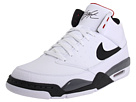

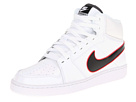

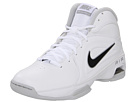

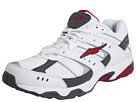

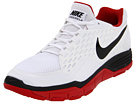

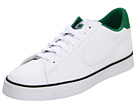

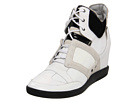

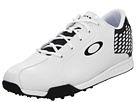

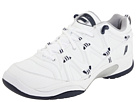

In [ ]:
images = [ PILImage.create(images_path/f) for f in neighbors.path] 
#PILImage.create(btn_upload.data[-1])
for im in images:
    display(im.to_thumb(IMG_SIZE,IMG_SIZE))
          

In [ ]:
#export
def query_neighs(q_feat, myneighs, data, root_path, show = True):
    """
    query feature: (vector)
    myneighs:  fit knn object
    data: series or df containing "path"
    root_path:  path to image files
    """
    distance, nn_index = myneighs.kneighbors(q_feat, return_distance=True)  
    dist = distance.tolist()[0] 

    # fix path to the database...
    neighbors = data.iloc[nn_index.tolist()[0]].copy()
    images = [ PILImage.create(root_path/f) for f in neighbors.path] 
    #PILImage.create(btn_upload.data[-1])
    if show:
        for im in images: display(im.to_thumb(IMG_SIZE,IMG_SIZE))

    return images
        
        

In [ ]:
# export
def get_similar_images(paths_df,model,knns,im_sizes = IMG_SIZES,fnm=None,db=DBS['zappos'],disp=True):
    similar_images = []
    for sz in im_sizes:
        print(SIZE_ABBR[sz])
        print(im_sizes[sz])

        features = f"features_{SIZE_ABBR[sz]}"
        print(features)
        
        if fnm is None:
            im_path = D_ROOT/db
            fnm = im_path/QUERY_IM
            

        query_t = load_and_prep_sneaker(fnm,im_sizes[sz])
        query_f = get_convnet_feature(model,query_t)

        similar_images.append( query_neighs(query_f, knns[sz], paths_df, im_path, show=False) )
        if disp:
            im = PILImage.create(fnm)
            display(im.to_thumb(im_sizes[sz]))
    
    return similar_images


sm
128
features_sm


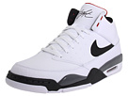

md
160
features_md


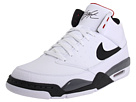

lg
224
features_lg


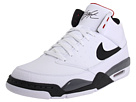

In [ ]:
similar_images =  get_similar_images( paths_df,model,knns)


In [ ]:
# export
def plot_sneak_neighs(images):
    ''' function to plot matrix of image urls. 
        image_urls[:,0] should be the query image
        
    Args: 
        images: list of lists
    
    return: 
        null
        saves image file to directory
    '''
    nrow = len(images)
    ncol = len(images[0])
    
    fig = plt.figure(figsize = (20, 20))

    num=0
    for row,image_row in enumerate(images):
        for col,img in enumerate(image_row):
    
            plt.subplot(nrow, ncol, num+1)
            plt.axis('off')
            plt.imshow(img);

            if num%ncol == 0: 
                plt.title('Query')

            if col>0: 
                plt.title('Neighbor ' + str(col))
            num += 1
    plt.savefig('image_search.png')
    plt.show()
        


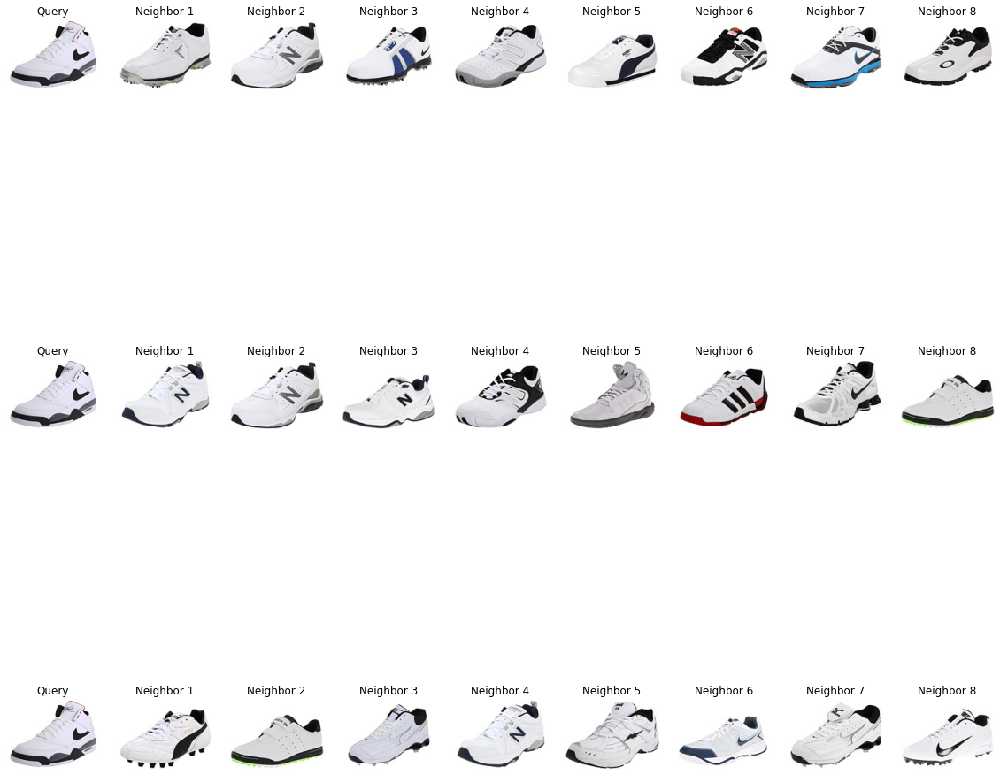

In [ ]:
plot_sneak_neighs(similar_images)


In [ ]:
model = create_cnn_featurenet('mobilenet_v2',to_cuda=True)


similar_images2 = []
for sz in IMG_SIZES:
    print(SIZE_ABBR[sz])
    print(IMG_SIZES[sz])
    
    features = f"features_{SIZE_ABBR[sz]}"
    print(features)

    query_t = load_and_prep_sneaker(QUERY_IM2,IMG_SIZES[sz])
    query_f = get_convnet_feature(model,query_t)
    
    similar_images2.append( query_neighs(query_f, knns[sz], paths, images_path, show=False) )

    im = PILImage.create(QUERY_IM2)
    display(im.to_thumb(IMG_SIZES[sz]))
    
plot_sneak_neighs(similar_images2)


sm
128
features_sm


NameError: name 'paths' is not defined

## visualize the embedding:  PCA + UMAP

sm
128
features_sm
Explained variation per principal component (szsmall): [0.11515645 0.06882259]


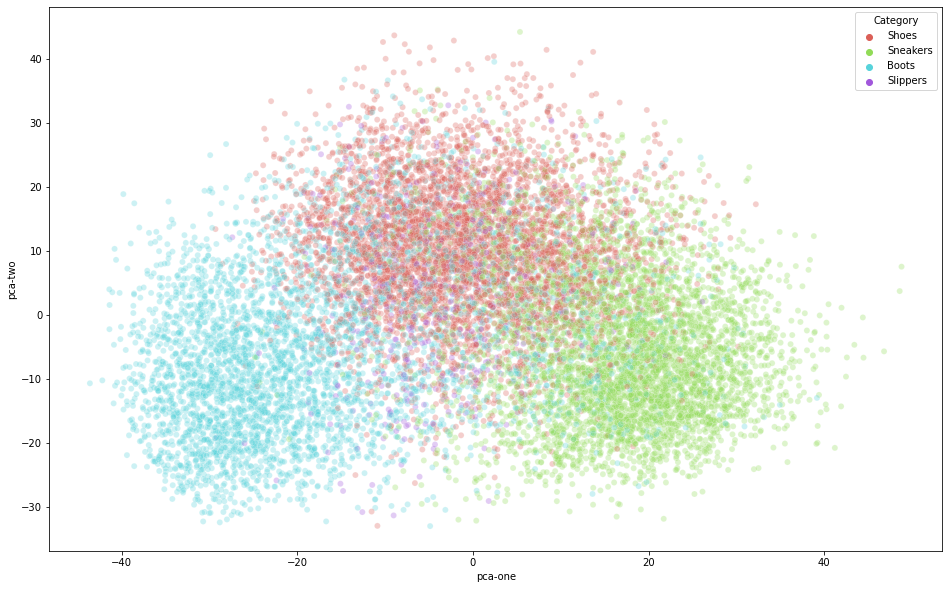

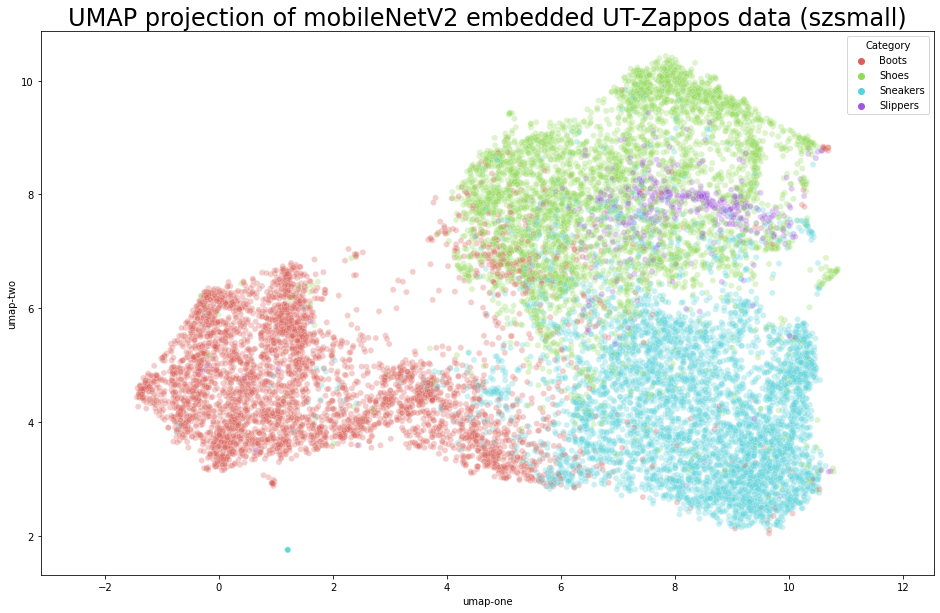

md
160
features_md
Explained variation per principal component (szmedium): [0.12368079 0.07145122]


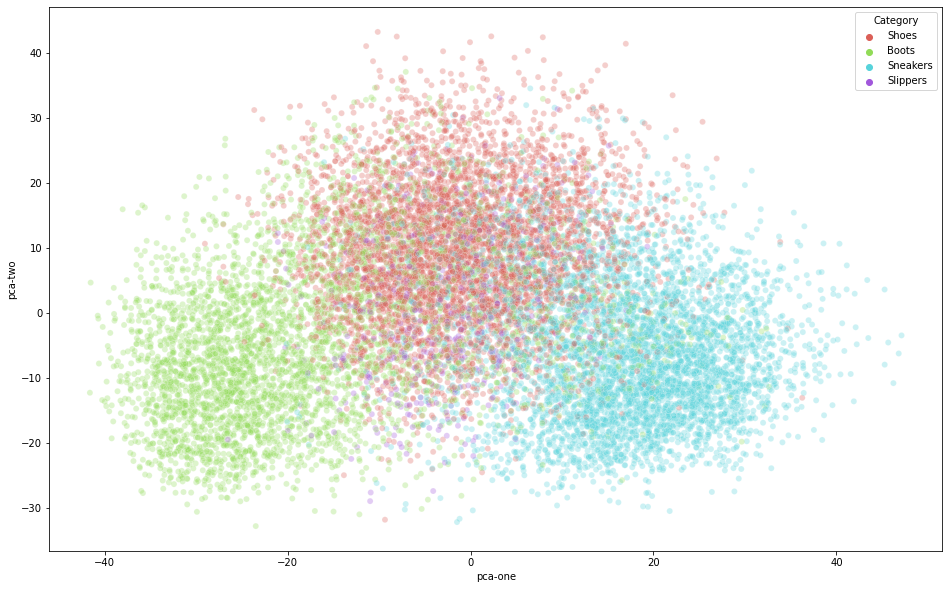

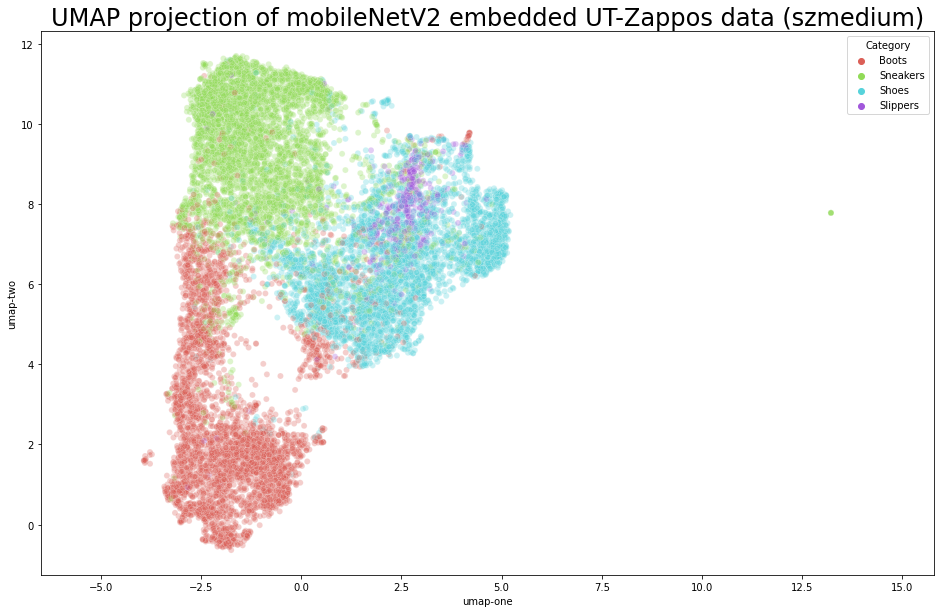

lg
224
features_lg
Explained variation per principal component (szlarge): [0.12368079 0.07145125]


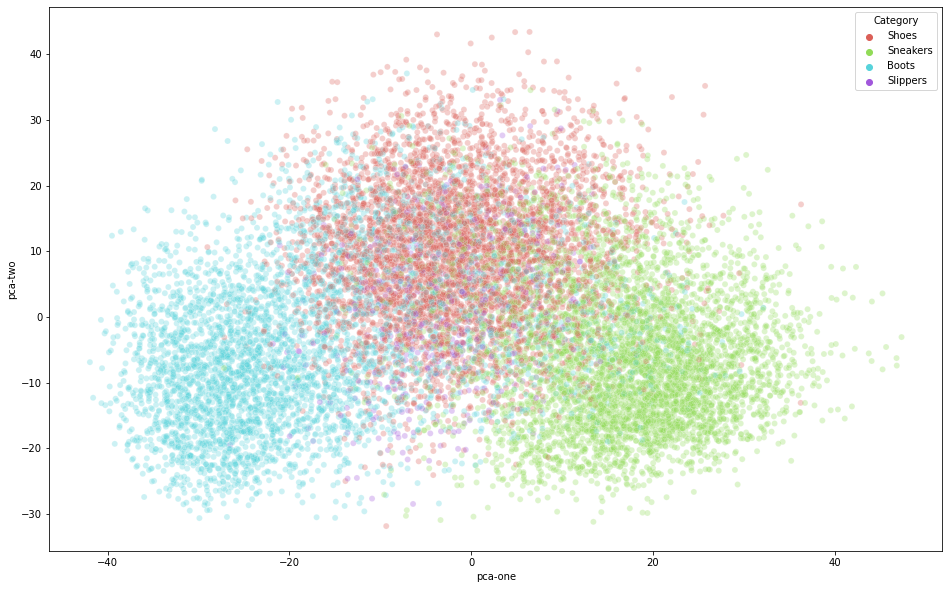

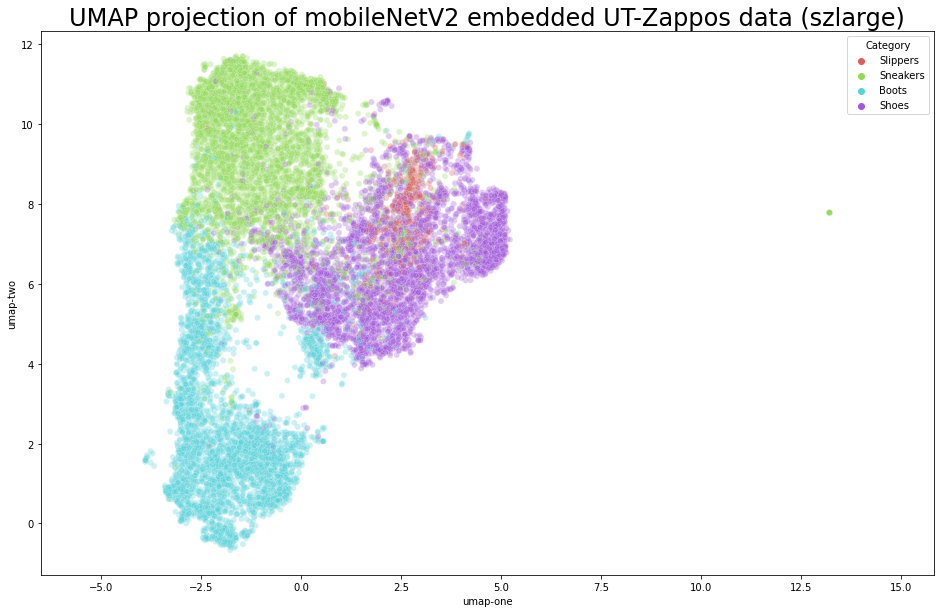

In [ ]:

# first simple PCA
pca = PCA(n_components=2)

for i,sz in enumerate(IMG_SIZES):
    print(SIZE_ABBR[sz])
    print(IMG_SIZES[sz])
    
    features = f"features_{SIZE_ABBR[sz]}"
    print(features)
    
    data = df[['Category',features]].copy()

    db_feats = np.vstack(data[features].values)

    # PCA
    pca_result = pca.fit_transform(db_feats)
    data['pca-one'] = pca_result[:,0]
    data['pca-two'] = pca_result[:,1] 
    print(f"Explained variation per principal component (sz{sz}): {pca.explained_variance_ratio_}")

    smpl_fac=.5
    #data=df.reindex(rndperm)

    plt.figure(figsize=(16,10))
    sns.scatterplot(
        x="pca-one",
        y="pca-two",
        hue="Category",
        palette=sns.color_palette("hls", 4),
        data=data.sample(frac=smpl_fac),
        legend="full",
        alpha=0.3
    )
    plt.savefig(f'PCA 2-D sz{sz}')
    plt.show()
    
    
    # get the UMAP on deck
    embedding = reducers[i].transform(db_feats)
    
    data['umap-one'] = embedding[:,0]
    data['umap-two'] = embedding[:,1] 

    plt.figure(figsize=(16,10))
    sns.scatterplot(
        x="umap-one",
        y="umap-two",
        hue="Category",
        palette=sns.color_palette("hls", 4),
        data=data.sample(frac=smpl_fac),
        legend="full",
        alpha=0.3
    )
    plt.gca().set_aspect('equal', 'datalim')
    plt.title(f'UMAP projection of mobileNetV2 embedded UT-Zappos data (sz{sz})', fontsize=24)
    plt.savefig('UMAP 2-D sz{sz}') 
    plt.show()


In [ ]:
#export
def get_umap_embedding(latents):
    reducer = umap.UMAP(random_state=666)
    reducer.fit(latents)
    embedding = reducer.transform(latents)
    assert(np.all(embedding == reducer.embedding_))
    
    return embedding

In [ ]:
fn = df.path.values
type(db_feats)

snk2vec = dict(zip(fn,db_feats))

snk2vec[list(snk2vec.keys())[0]]

embedding = get_umap_embedding(db_feats)
snk2umap = dict(zip(fn,embedding))
  

In [ ]:
# hide
# from sklearn.manifold import TSNE

# cov_mat =np.cov(vects.T)
# plt.figure(figsize=(10,10))
# sns.set(font_scale=1.5)
# hm = sns.heatmap(cov_mat,
#                  cbar=True,
#                  annot=True,
#                  square=True,
#                  fmt='.2f',
#                  annot_kws={'size': 12},
#                  cmap='coolwarm')
# plt.title('Covariance matrix showing correlation coefficients', size = 18)
# plt.tight_layout()
# plt.show()

## GLM:  Logistic regression on the mobilnet_v2 features: validation and categorization

Note that because we're not really doing parameter fitting, we'll ignore the validation set and add it to training.   

TODO:  make some wrapper functions to perform the classification via Logistic regression.

/home/ergonyc/anaconda3/envs/fastai/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[[1219   18    2   22]
 [  21 1216   19   73]
 [   3   34   94    7]
 [  37   87    5 1286]]


/home/ergonyc/anaconda3/envs/fastai/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


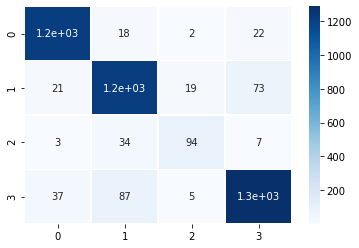

<Figure size 1152x1152 with 0 Axes>

In [ ]:
filename = f"zappos-50k-{model.name}-features_sort_3"

df = pd.read_pickle(f"data/{filename}.pkl")

#Display Confusion Matrix
X_test = np.vstack(df[df.t_t_v=='test']['features_md'])
y_test = np.vstack(df[df.t_t_v=='test']['Category']).flatten()

# use validate and train for training (no validation here)
X_train = np.vstack(df[df.train | df.validate]['features_md'])
y_train = np.vstack(df[df.train | df.validate]['Category']).flatten()


clf_log = LogisticRegression(C = 1, multi_class='ovr', max_iter=2000, solver='lbfgs')
clf_log.fit(X_train, y_train)
log_score = clf_log.score(X_test, y_test)
log_ypred = clf_log.predict(X_test)

log_confusion_matrix = confusion_matrix(y_test, log_ypred)
print(log_confusion_matrix)

disp = heatmap(log_confusion_matrix, annot=True, linewidths=0.5, cmap='Blues')
plt.savefig('log_Matrix.png')


plt.figure(figsize=(16,16))


# Plot non-normalized confusion matrix
titles_options = [("Confusion matrix, without normalization", None),
                  ("Normalized confusion matrix", 'true')]

Confusion matrix, without normalization
[[1219   18    2   22]
 [  21 1216   19   73]
 [   3   34   94    7]
 [  37   87    5 1286]]
Normalized confusion matrix
[[0.9666931  0.01427439 0.00158604 0.01744647]
 [0.01580135 0.91497366 0.01429646 0.05492852]
 [0.02173913 0.24637681 0.68115942 0.05072464]
 [0.02614841 0.0614841  0.00353357 0.90883392]]


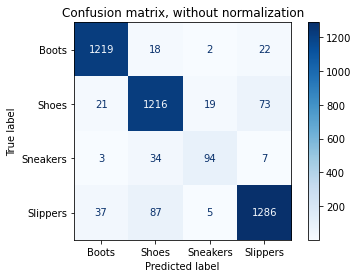

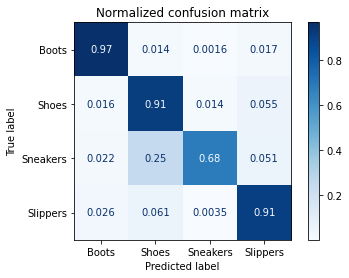

In [ ]:
class_names = df.Category.unique()

for title, normalize in titles_options:
    disp = plot_confusion_matrix(clf_log, X_test, y_test,
                                 display_labels=class_names,
                                 cmap=plt.cm.Blues,
                                 normalize=normalize)
    disp.ax_.set_title(title)

    print(title)
    print(disp.confusion_matrix)

plt.savefig('log_Matrix2.png')

## export

In [ ]:


from nbdev.export import notebook2script
notebook2script()



Converted 00_core.ipynb.
Converted 01a_zappos_data.ipynb.
Converted 01b_scraped_data.ipynb.
Converted 02_model.ipynb.
Converted 03a_cvae.ipynb.
Converted index.ipynb.


In [ ]:
# hide

# ### NOTE: these are from https://walkwithfastai.com/Style_Transfer

# # these are the convlayer "features" to define style for styletransfer
# _vgg_config = {
#     'vgg16' : [1, 11, 18, 25, 20],
#     'vgg19' : [1, 6, 11, 20, 29, 22]
# }

# from torchvision.models import vgg19, vgg16

# feat_net = vgg19(pretrained=True).features.cuda().eval()

# def get_feats(arch:str, pretrained=True):
#     "Get the features of an architecture"
#     feat_net, layers = _get_layers(arch, pretrained)
#     hooks = hook_outputs(layers, detach=False)
#     def _inner(x):
#         feat_net(x)
#         return hooks.stored
#     return _inner



# def _get_layers(arch:str, pretrained=True):
#     "Get the layers and arch for a VGG Model (16 and 19 are supported only)"
#     feat_net = vgg19(pretrained=pretrained).cuda() if arch.find('9') > 1 else vgg16(pretrained=pretrained).cuda()
#     config = _vgg_config.get(arch)
#     features = feat_net.features.cuda().eval()
#     for p in features.parameters(): p.requires_grad=False
#     return feat_net, [features[i] for i in config]



# feats = get_feats('vgg19')
